<center> <img src="https://d3i71xaburhd42.cloudfront.net/261c3e30bae8b8bdc83541ffa9331b52fcf015e6/3-Figure2-1.png" width=50% > </center>

<br><br>

<center> 
    <font size="6">Lab 1: Colour, Intrinsic Image Decomposition & Photometric Stereo</font> 
</center>
<center> 
    <font size="4">Computer Vision 1 University of Amsterdam</font> 
</center>
<center> 
    <font size="4">Due 23:59, September 13, 2024 (Amsterdam time)</font> 
</center>
<center> 
    <font size="4"><b>TA's: Xiaoyan, Floris, Adrian</b></font>
</center>

<br><br>

***

<br><br>

<center>

Student1 ID:  16322495\
Student1 Name: Ozan Ilhan

Student2 ID: 16034228\
Student2 Name: Aleksandr Raudvee

Student3 ID: 14646161\
Student3 Name: Nora Kahleogullari

</center>

### **Import Libraries**

In [2]:
import sys

if sys.version_info[0] < 3:
    raise Exception("Python 3 or a more recent version is required.")

In [3]:
# environment and libraries
import os
import glob
import numpy as np
import random
import cv2
import matplotlib
import matplotlib.pyplot as plt

import warnings
warnings.simplefilter(action = "ignore", category = RuntimeWarning)
warnings.simplefilter(action = "ignore", category = UserWarning)

from mpl_toolkits.mplot3d import Axes3D

In [4]:
# Make sure you're using the provided environment!
assert cv2.__version__ == "4.10.0", "You're not using the provided Python environment!"
assert np.__version__ == "1.26.4", "You're not using the provided Python environment!"
assert matplotlib.__version__ == "3.9.2", "You're not using the provided Python environment!"
# Proceed to the next cell if you don't get any error.

### **Instructions**

Your code and discussion must be handed in this jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Lab 1 Assignment. Please also fill out your names and ID's above.

For full credit, make sure your notebook follows these guidelines:
- It is mandatory to **use the Python environment provided** with the assignment; the environment specifies the package versions that have to be used to prevent the use of particular functions. Using different packages versions may lead to grade deduction. In the Python cell above you can check whether your environment is set up correctly.
- To install the environment with the right package versions, use the following command in your terminal: ```conda env create --file=cv1_environment.yaml```, then activate the environment using the command ```conda activate cv1```.
- Do not use additional packages or materials that have not been provided or explicitly mentioned.
- Please express your thoughts **concisely**. The number of words does not necessarily correlate with how well you understand the concepts.
- Answer all given questions and sub-questions.
- Try to understand the problem as much as you can. When answering a question, give evidences (qualitative and/or quantitative results, references to papers, figures etc.) to support your arguments. Note that not everything might be explicitly asked for and you are expected to think about what might strengthen you arguments and make the notebook self-contained and complete.
- Tables and figures must be accompanied by a **brief** description. Do not forget to add a number, a title, and if applicable name and unit of variables in a table, name and unit of axes and legends in a figure.

__Note:__ A more complete overview of the lab requirements can be found in the Course Manual on Canvas

Late submissions are not allowed. Assignments that are submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance, to avoid last minute system failure issues.

Plagiarism note: Keep in mind that plagiarism (submitted materials which are not your work) is a serious crime and any misconduct shall be punished with the university regulations. This includes the use of generative tools such as ChatGPT.

**ENSURE THAT YOU SAVE ALL RESULTS / ANSWERS ON THE QUESTIONS (EVEN IF YOU RE-USE SOME CODE).**

### **Overview**

- [Section 1: Colour Spaces (13 points)](#section-1)
  - [Question 1 (2 points)](#question-1)
  - [Question 2 (6 points)](#question-2)
  - [Question 3 (2 points)](#question-3)
  - [Question 4 (2 points)](#question-4)
  - [Question 5 (1 point)](#question-5)
- [Section 2: Colour Constancy (13 points)](#section-2)
  - [Question 6 (8 points)](#question-6)
  - [Question 7 (2 points)](#question-7)
  - [Question 8 (3 points)](#question-8)
- [Section 3: Intrinsic Image Decomposition (14 points)](#section-3)
  - [Question 9 (2 points)](#question-9)
  - [Question 10 (2 points)](#question-10)
  - [Question 11 (4 points)](#question-11)
  - [Question 12 (2 points)](#question-12)
  - [Question 13 (2 points)](#question-13)
  - [Question 14 (2 points)](#question-14)
- [Section 4: Photometric Stereo (60 points)](#section-4)
  - [Question 15 (4 points)](#question-15)
  - [Question 16 (2 points)](#question-16)
  - [Question 17 (1 point)](#question-17)
  - [Question 18 (2 points)](#question-18)
  - [Question 19 (2 points)](#question-19)
  - [Question 20 (5 points)](#question-20)
  - [Question 21 (3 points)](#question-21)
  - [Question 22 (6 points)](#question-22)
  - [Question 23 (2 points)](#question-23)
  - [Question 24 (2 points)](#question-24)
  - [Question 25 (3 points)](#question-25)
  - [Question 26 (2 points)](#question-26)
  - [Question 27 (2 points)](#question-27)
  - [Question 28 (5 points)](#question-28)
  - [Question 29 (2 points)](#question-29)
  - [Question 30 (2 points)](#question-30)
  - [Question 31 (4 points)](#question-31)
  - [Question 32 (1 point)](#question-32)
  - [Question 33 (2 points)](#question-33)
  - [Question 34 (2 points)](#question-34)
  - [Question 35 (1 point)](#question-35)
  - [Question 36 (4 points)](#question-36)
  - [Question 37 (1 point)](#question-37)
- [Section X: Individual Contribution Report (Mandatory)](#section-x)

<a id="section-1"></a>
### **Section 1: Colour Spaces**

In this part of the assignment, you will study the different colour spaces for image representations and experiment how to convert a given RGB image to a specific colour space

<a id="question-1"></a>
#### <font color='#FF0000'>Question 1 (2 points)</font>

Why do we use the RGB color model as the basis for our digital cameras and photography? How does a standard digital camera capture a full RGB color image?

##### <font color='yellow'>Answer:</font>

>*We use RGB, because humans also have 3 types of sensitivity in the cones, and its replicated to reproduce what we see. A color filter array is overlaid on the sensor. Each pixel records only one color (red, blue, green) and then the surrounding pixels, estimate the missing channels.*

Szeliski, R. (2021). Computer Vision: Algorithms and Applications. Springer Science & Business Media.

<a id="question-2"></a>
#### <font color='#FF0000'>Question 2 (6 points)</font>

Create a function to convert an RGB image into various color spaces using the provided `convert_colour_space()` function and other sub-functions.

**Color Spaces to Convert:**

1. **Grayscale**

   Convert the RGB image into grayscale using 3 different methods mentioned in [John D. Cook's blog](https://www.johndcook.com/blog/2009/08/24/algorithms-convert-color-grayscale/). Additionally, check and report which method OpenCV uses for grayscale conversion, include it as well, and visualize all 4 methods in the same figure.

2. **Opponent Color Space**

   $\begin{pmatrix}
   O_1 \\
   O_2 \\
   O_3
   \end{pmatrix}$ = $\begin{pmatrix}
   \frac{R-G}{\sqrt{2}} \\
   \frac{R+G-2B}{\sqrt{6}} \\
   \frac{R+G+B}{\sqrt{3}}
   \end{pmatrix}$

3. **Normalized RGB (rgb) Color Space**

   $\begin{pmatrix}
   r \\
   g \\
   b
   \end{pmatrix}$ = $\begin{pmatrix}
   \frac{R}{R+G+B} \\
   \frac{G}{R+G+B} \\
   \frac{B}{R+G+B}
   \end{pmatrix}$

4. **HSV Color Space**

   Convert the RGB image into HSV Color Space using OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2HSV)*.

5. **YCbCr Color Space**

   Convert the RGB image into YCbCr Color Space using OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2YCrCb)*. Arrange the channels in $Y, C_b,$ and $C_r$ order.

**Note:** 

- Ensure you understand the data types and ranges required by the Python conversion and image displaying functions. This usually means [0, 1] for float datatype or [0, 255] for integer datatype. Explicitly change the datatype if necessary.

- Each color space may have its own visualization requirements. For instance, think about how to meaningfully visualize the H, S, and V channels. Ensure each channel is visualized in an RGB manner where applicable.

**Extra:** It might be interesting to visualize the image in its original color space (RGB) as well.

In [5]:
def convert_rgb_to_grays(input_image):
    '''
    Converts an RGB image into grayscale using different methods and 
    returns the grayscale images stacked as separate channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing different grayscale conversion methods
    '''

    # convert input image to array format if not already
    # YOUR CODE HERE
    img = input_image.astype(np.float32)

    B = img[:,:, 0]
    G = img[:,:, 1]
    R = img[:,:, 2]

    # lightness method
    # YOUR CODE HERE
    lightness = (np.maximum.reduce([R, G, B]) + np.minimum.reduce([R, G, B])) / 2

    # average method
    # YOUR CODE HERE
    average = (R + G + B)/ 3

    # luminosity method
    # YOUR CODE HERE
    luminosity = 0.21*R + 0.72 *G + 0.07*B

    # built-in OpenCV function
    # YOUR CODE HERE
    opencv = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_RGB2GRAY).astype(np.float32)

    # stack the results to easily visualize the 4 different methods
    new_image = np.stack([lightness, average, luminosity, opencv], axis=-1)

    return new_image

In [6]:
def convert_rgb_to_opponent(input_image):
    '''
    Converts an RGB image into the opponent color space and 
    returns the image with opponent color channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing opponent color space
    '''

    # YOUR CODE HERE
    img = input_image.astype(np.float32)
    B = img[:,:, 0]
    G = img[:,:, 1]
    R = img[:,:, 2]

    ni1 = (R - G) / np.sqrt(2)
    ni2 = (R + G - 2*B)/np.sqrt(6)
    ni3 = (R + G + B)/np.sqrt(3)

    new_image = np.stack([ni1, ni2, ni3], axis=-1)


    return new_image

In [7]:
def convert_rgb_to_normedrgb(input_image):
    '''
    Converts an RGB image into the normalized RGB (nrgb) color space and 
    returns the image with normalized RGB channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing normalized RGB color space
    '''

    # YOUR CODE HERE
    img = input_image.astype(np.float32)
    B = img[:,:, 0]
    G = img[:,:, 1]
    R = img[:,:, 2]

    ni1 = R / (R + G + B)
    ni2 = G / (R + G + B)
    ni3 = B / (R + G + B)

    new_image = np.stack([ni1, ni2, ni3], axis=-1)

    return new_image

In [8]:
def convert_colour_space(input_image, colourspace):
    '''
    Converts an RGB image into a specified color space and 
    returns the image in its new color space.

    Args:
        input_image: RGB image
        colourspace: colour space to be converted to. 
        - choices: opponent, nrgb, hsv, ycbcr, grays

    Returns:
        new_image: image with channels in provided colour space
    '''

    # Convert the image into double precision for conversions
    input_image = np.clip(input_image, 0, 255).astype(np.uint8)


    if colourspace.lower() == 'opponent':
        # fill in the rgb2opponent function

        new_image = convert_rgb_to_opponent(input_image)

    elif colourspace.lower() == 'nrgb':
        # fill in the rgb2normedrgb function

        new_image = convert_rgb_to_normedrgb(input_image)

    elif colourspace.lower() == 'hsv':
        # use built-in function from opencv

        # YOUR CODE HERE
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2HSV)

    elif colourspace.lower() == 'ycbcr':
        # use built-in function from opencv

        ycrcb = cv2.cvtColor(input_image, cv2.COLOR_RGB2YCrCb)

        Y = ycrcb[:,:, 0]
        Cr = ycrcb[:,:, 1]
        Cb = ycrcb[:,:, 2]
        
        new_image = np.stack([Y, Cb, Cr], axis=-1)
        
        # YOUR CODE HERE

    elif colourspace.lower() == 'grays':
        # fill in the rgb2grays function

        new_image = convert_rgb_to_grays(input_image)

    else:
        raise NotImplementedError('Unknown colorspace type [%s]...' % colourspace)

    return new_image

<a id="question-3"></a>
#### <font color='#FF0000'>Question 3 (2 points)</font>

Visualize the image in each new color space and its individual channels separately within the same figure. For example, for the HSV color space, visualize the converted HSV image and its Hue, Saturation, and Value channels separately (4 images in 1 figure). Ensure that the channel visualizations are **meaningful**.

The function `visualize_colourspace` below needs to be completed.

In [9]:
def visualize_colourspace(image, colourspace='rgb'):
    """
    Visualize the image in its corresponding colour space.
    This function visualizes 1 figure with 4 images.
    Hint: some RGB representation of the new colour space image + each of its channels

    Args:
        image: image with channels of some colour space
        colourspace: colour space to be converted to. 
        - choices: opponent, nrgb, hsv, ycbcr, grays
    """

    # YOUR CODE HERE
    img = np.clip(image, 0, 255).astype(np.uint8)

    if colourspace == 'opponent':
        # YOUR CODE HERE
        new_image = convert_rgb_to_opponent(img)
        fig_title = "Figure 69 visualizing opponent colourspace"

    elif colourspace in ['rgb', 'nrgb']:
        # YOUR CODE HERE
        if colourspace == 'rgb':
            new_image = img
        else:
            new_image = convert_rgb_to_normedrgb(img)
        fig_title = f"Figure 66 visualizing {colourspace} colourspace"


    elif colourspace == 'hsv':
        # YOUR CODE HERE
        new_image = convert_colour_space(img, 'hsv').astype(np.float32)

        fig_title = "Figure 67 visualizing hsv colourspace"

    elif colourspace == 'ycbcr':
        # YOUR CODE HERE
        new_image = convert_colour_space(img, 'ycbcr').astype(np.float32)
        fig_title = "Figure 68 visualizing ycbcr colourspace"

    elif colourspace == 'grays':
        # YOUR CODE HERE
        new_image = convert_rgb_to_grays(img).astype(np.float32)
        fig_title = "Figure 70 visualizing grays colourspace"


    else:
        raise NotImplementedError('Unknown colorspace type [%s]...' % colourspace)
    
    fig = plt.figure(figsize=(12,8))
    fig.suptitle(fig_title)

    if colourspace == 'opponent':
        O1, O2, O3 = new_image[..., 0], new_image[...,1], new_image[...,2]
    
        O1 = O1.astype(np.float32)
        O2 = O2.astype(np.float32)
        O3 = O3.astype(np.float32)
        O1n = np.zeros_like(O1) if O1.max() <= O1.min() else (O1 - O1.min()) / (O1.max() - O1.min())
        O2n = np.zeros_like(O2) if O2.max() <= O2.min() else (O2 - O2.min()) / (O2.max() - O2.min())
        O3n = np.zeros_like(O3) if O3.max() <= O3.min() else (O3 - O3.min()) / (O3.max() - O3.min())

        comp = np.dstack([O1n, O2n, O3n])


        panels = [
        (comp, 'Opponent '),
        (O1, 'O1'),
        (O2, 'O2'),
        (O3, 'O3'),
        ]
        for i, (p,t) in enumerate(panels,1):
            ax = plt.subplot(2,2,i)
            if p.ndim == 3:
                ax.imshow(np.clip(p,0,1))
            else:
                pn = (p - p.min()) / (p.max() - p.min() + 1e-8)
                ax.imshow(pn, cmap='gray', vmin=0, vmax=1)
            ax.set_title(t); ax.axis('off')

    elif colourspace in ['rgb', 'nrgb']:
        if new_image.max() > 1.0:
            comp = new_image/255.0
        else:
            np.clip(new_image, 0, 1)
        R, G, B = comp[..., 0], comp[...,1], comp[...,2]

        panels = [
            (comp, 'RGB/nRGB'),
            (R, 'Channel 1'),
            (G, 'Channel 2'),
            (B, 'Channel 3'),
        ]
        for i, (p,t) in enumerate(panels,1):
            ax = plt.subplot(2,2,i)
            if p.ndim == 3:
                ax.imshow(np.clip(p,0,1))
            else:
                ax.imshow(p, cmap='gray', vmin=0, vmax=1)
            ax.set_title(t); ax.axis('off')

    elif colourspace == 'hsv':
        H = np.clip(new_image[...,0], 0, 179).astype(np.uint8)
        S = np.clip(new_image[...,1], 0, 255).astype(np.uint8)
        V = np.clip(new_image[...,2], 0, 255).astype(np.uint8)
        comp = cv2.cvtColor(np.dstack([H,S,V]), cv2.COLOR_HSV2RGB).astype(np.float32)/255.0

        Hn = H.astype(np.float32)/179.0
        Sn = S.astype(np.float32)/255.0
        Vn = V.astype(np.float32)/255.0

        panels = [
            (comp, 'HSV-RGB '),
            (Hn, 'Hue'),
            (Sn, 'Saturation'),
            (Vn, 'Value'),
        ]
        for i, (p,t) in enumerate(panels,1):
            ax = plt.subplot(2,2,i)
            if p.ndim == 3:
                ax.imshow(np.clip(p,0,1))
            else:
                ax.imshow(p, cmap='gray', vmin=0, vmax=1)
            ax.set_title(t); ax.axis('off')

    elif colourspace == 'ycbcr':
        Y = np.clip(new_image[...,0], 0, 255).astype(np.uint8)
        Cb = np.clip(new_image[...,1], 0, 255).astype(np.uint8)
        Cr = np.clip(new_image[...,2], 0, 255).astype(np.uint8)
        comp = cv2.cvtColor(np.dstack([Y,Cr,Cb]), cv2.COLOR_YCrCb2RGB).astype(np.float32)/255.0

        panels = [
            (comp, 'YCbCr-RGB '),
            (Y.astype(np.float32)/255.0, 'Y'),
            (Cb.astype(np.float32)/255.0, 'Cb'),
            (Cr.astype(np.float32)/255.0, 'Cr'),
        ]
        for i, (p,t) in enumerate(panels,1):
            ax = plt.subplot(2,2,i)
            if p.ndim == 3:
                ax.imshow(np.clip(p,0,1))
            else:
                ax.imshow(p, cmap='gray', vmin=0, vmax=1)
            ax.set_title(t); ax.axis('off')

    elif colourspace in 'grays':
        if new_image.max() > 1.0:
            scale = 255.0
        else:
            scale = 1.0

        L =  np.clip(new_image[...,0]/scale, 0 ,1)
        A= np.clip(new_image[...,1]/scale, 0 ,1)
        Lu =  np.clip(new_image[...,2]/scale, 0 ,1)
        Oc = np.clip(new_image[...,3]/scale, 0 ,1)

        panels = [
            (L, 'Lightness'),
            (A, 'Avg'),
            (Lu, 'Luminosity'),
            (Oc, 'Opencv gray'),
        ]
        for i, (p,t) in enumerate(panels,1):
            ax = plt.subplot(2,2,i)
            ax.imshow(p, cmap='gray', vmin=0, vmax=1)
            ax.set_title(t); ax.axis('off')


    plt.show()

Visualizing RGB color space:


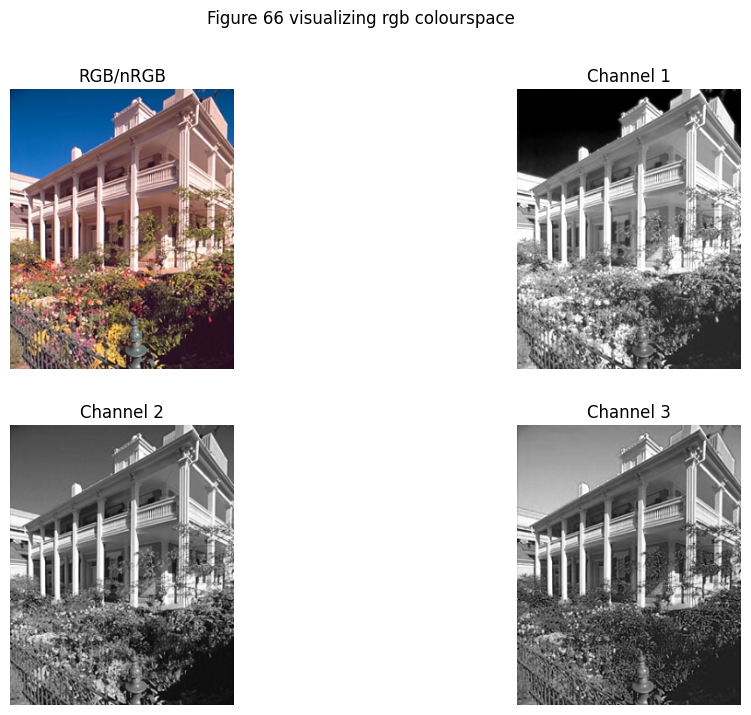

Visualizing HSV color space:


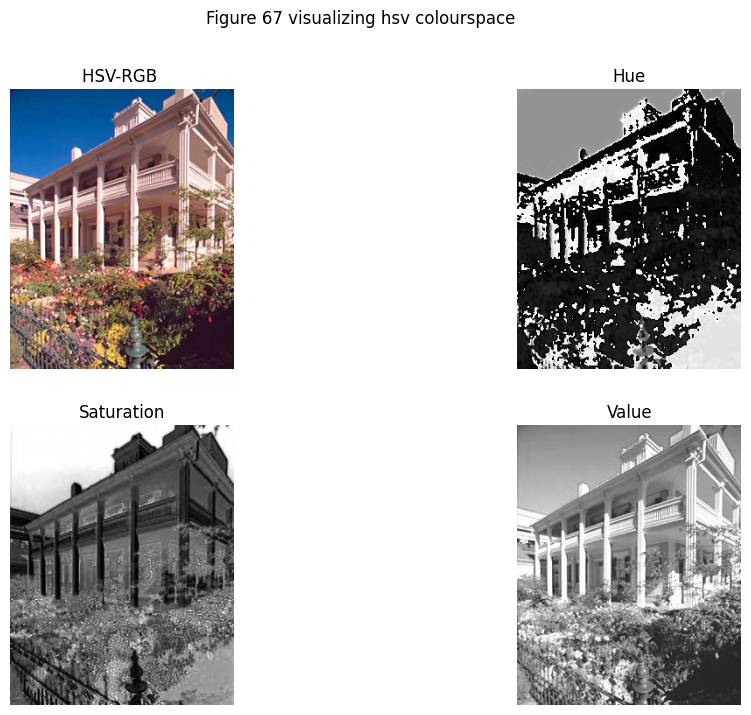

Visualizing YCbCr color space:


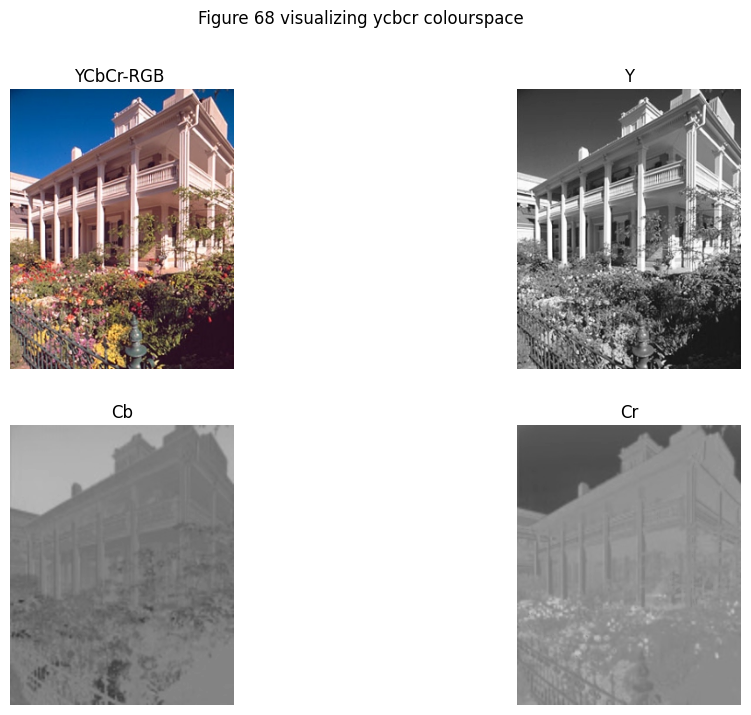

Visualizing Opponent color space:


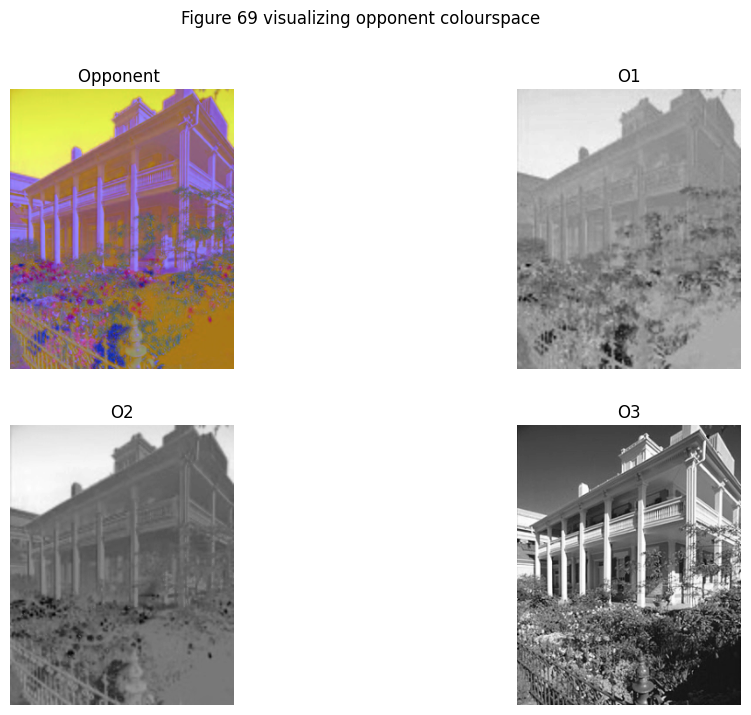

Visualizing Grayscale:


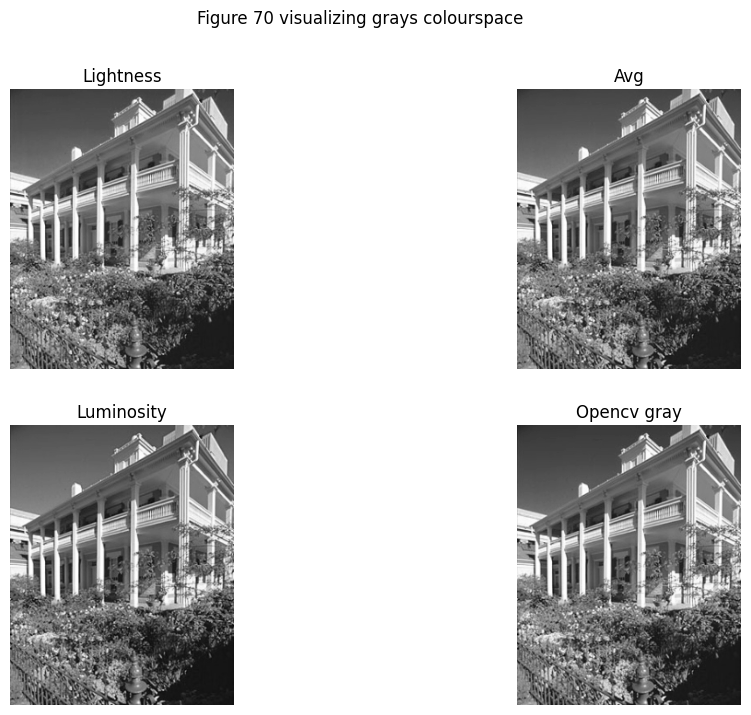

In [10]:
# Load and convert the image to RGB
image = cv2.imread('images/beehive_house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# YOUR CODE HERE

print("Visualizing RGB color space:")
visualize_colourspace(image, colourspace='rgb')

print("Visualizing HSV color space:")
visualize_colourspace(image, colourspace='hsv')

print("Visualizing YCbCr color space:")
visualize_colourspace(image, colourspace='ycbcr')

print("Visualizing Opponent color space:")
visualize_colourspace(image, colourspace='opponent')

print("Visualizing Grayscale:")
visualize_colourspace(image, colourspace='grays')

Figure 1 starts from part 2, for now we call the first figure, figure 66

Figure 66 showcases each the RGB/nRGB colourspace, showing the composite image with the 3 channels separately

Figure 67 showcases the HSV colourspace, with the RGB version of the HSV image and the hue, saturation, value channels separately

Figure 68 showcases the YCbCr colourspace, with the RGB version of YCbCr image and the Y, Cb, Cr channels separately

Figure 69 showcases the opponent colourspace, showing the normalized version and the 3 channels separately

Figure 70 showcases the grayscale version, showing the lightness, average, luminosity and opencv version separately

<a id="question-4"></a>
#### <font color='#FF0000'>Question 4 (2 points)</font>

Explain each of the above 5 colour spaces and their properties. What are the benefits of using a different colour space other than RGB? Provide reasons for each of the above cases. You can include your observations from the visualizations.

##### <font color='yellow'>Answer:</font>


- opponent is inspired by the human vision, it highlights contrasts between opponent colors, O1 and O2 emphasize the differnce in colors so plants vs walls, sky vs building. O3 acts like a grayscale image as can be seen in Figure 69. It is useful when color differences matter more than absolute values
- with nrgb relative color proportions remain, it useful because its robust to lighting changes. The overall visualization stays the same as can be seen in Figure 66
- hsv seperates colors into hue, saturation and value, instead of RGB with this one it seperates the color vs brightness. It is usefull when analyzing colors when brightness doesnt matter. In figure 67 it can be clearly seen how each channel differs.
- ycbcr seperates luminance from chrominance, efficient for compression and similar to human vision properties, In Figure 68 it can be seen that y looks like grayscale and the other 2 look low-contrast and together they make a nearly identical rgb. it is useful because it is more sensitive to brightness 
- gray reduces the 3 channels to 1, simplifies processing, and comes in handy for when color is not important

Szeliski, R. (2021). Computer Vision: Algorithms and Applications. Springer Science & Business Media.

<a id="question-5"></a>
#### <font color='#FF0000'>Question 5 (1 point)</font>

Find one more colour space from the literature, briefly explain its properties and give a use case.

##### <font color='yellow'>Answer:</font>

>* Another colourspace is CIELAB, its perceptually uniform in cases of luminance and chrominance. The color better reflect the human perception, so with color-based clustering it is more accurate. When humans need to see the color differences CIEALB comes in handy.

Szeliski, R. (2021). Computer Vision: Algorithms and Applications. Springer Science & Business Media.

<a id="section-2"></a>
### **Section 2: Colour Constancy**

Colour constancy is the ability to perceive the colors of objects consistently, regardless of the color of the light source. The goal of color constancy algorithms is to estimate the light source's illuminant and then correct the image so that it appears as if taken under a canonical (white) light source. In digital cameras, the automatic white balance (AWB) function performs this task to ensure images look natural.

In this part of the assignment, you will implement the well-known Grey-World Algorithm, a fundamental color constancy algorithm. This algorithm operates under the assumption that, under white light, the average color in a scene should be grey ([128, 128, 128]).

For more information, refer to the [Grey World algorithm on Wikipedia.](https://en.wikipedia.org/wiki/Color_normalization#Grey_world)

<a id="question-6"></a>
#### <font color='#FF0000'>Question 6 (8 points)</font>

Complete the function `apply_grey_world_algorithm` to apply color correction to an RGB image using the Grey-World algorithm.

Display the original image and the color-corrected one on the same figure. Use the `beehive_house.jpg` image to test your algorithm. You should see that the reddish color cast on the image is removed, making it look more natural.

***Note:*** You do not need to apply any pre or post-processing steps. For the calculation or processing, you are not allowed to use any available code or any dedicated library function except *standard Numpy functions*.

In [11]:
def apply_grey_world_algorithm(awb_img):
    """
    Apply the Grey-World algorithm to correct the color balance of an RGB image.

    This function assumes that under a white light source, the average color in a scene should be grey.
    It corrects the image by scaling each channel so that the mean of each channel is equal.

    Args:
        awb_img: RGB image to be color corrected

    Returns:
        gw_img: Color corrected image using the Grey-World algorithm
    """
    red, green, blue = cv2.split(awb_img)
    red_mean, green_mean, blue_mean = np.mean(red), np.mean(green), np.mean(blue)
    
    scaling_factor = 128
    scale_red = scaling_factor / red_mean
    scale_green = scaling_factor / green_mean
    scale_blue = scaling_factor / blue_mean
    red = red * scale_red
    green = green * scale_green
    blue = blue * scale_blue
    gw_img = np.dstack((red, green, blue))
    gw_img = np.clip(gw_img, 0, 255).astype(np.uint8)
    return gw_img


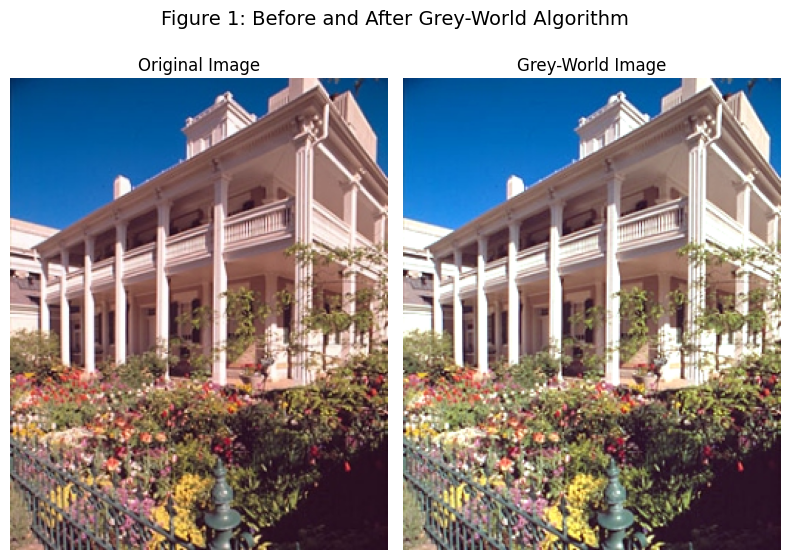

In [12]:
# load and convert the image to rgb
image = cv2.imread('images/beehive_house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# YOUR CODE HERE
gw_img = apply_grey_world_algorithm(image)

fig = plt.figure(figsize=(8,6))
fig.suptitle("Figure 1: Before and After Grey-World Algorithm", fontsize=14)
plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(gw_img)
plt.title("Grey-World Image")
plt.axis("off")

plt.tight_layout()
plt.show()

>Figure 1 shows the original image (left) and Grey-World corrected image (right). The correction reduces the reddish layer on the image, resulting in a more natural-looking image where the white colors are more balanced.

<a id="question-7"></a>
#### <font color='#FF0000'>Question 7 (2 points)</font>

Give an example case for Grey-World Algorithm on where it might fail. Include your reasoning.

##### <font color='yellow'>Answer:</font>

>This algorithm may fail in scenarios where one color is very dominant. If we take a photo of a forest, the dominant color is green. Red and blue channels will have a low mean value, which means the Grey-World algorithm will give them a higher weight than the green channel. This boosts the red and blue channel, making the image look more red/blue.

<a id="question-8"></a>
#### <font color='#FF0000'>Question 8 (3 points)</font>

Find out one more colour constancy algorithm from the literature and explain it briefly.

##### <font color='yellow'>Answer:</font>

>There is one algorithm that works similary to the Grey-World algorithm. This algorithm is: the Scale by Max algorithm. The difference between this algorithm and the Grey-World algorithm is that Scale by Max takes the max value of each channel, instead of the mean value (like the Grey-World algorithm does). This is the only difference <a name="cite_ref-3"></a>[<sup>[3]</sup>](#cite_note-3).

<a name="cite_note-3"></a><small>[3]: Agarwal, V., Abidi, B. R., Koschan, A., & Abidi, M. A. (2006). An overview of color constancy algorithms. Journal of Pattern Recognition Research, 1(1), 42-54.</small>

<a id="section-3"></a>
### **Section 3: Intrinsic Image Decomposition**

Intrinsic image decomposition is the process of separating an image into its formation components, such as reflectance (albedo) and shading (illumination). <a name="cite_ref-1"></a>[<sup>[1]</sup>](#cite_note-1) Then, under the assumptions of body (diffuse) reflection, linear sensor response and narrow band filters, the decomposition of the observed image $I(\vec{x})$ at position $\vec{x}$ can be approximated as the element-wise product of its albedo $R(\vec{x})$ and shading $S(\vec{x})$ intrinsics:

$$I(\vec{x})=R(\vec{x}) \times S(\vec{x})$$

In this part of the assignment, you will experiment with intrinsic image components to perform a particular computational photography application: material recolouring. For the experiments, we will use images from a synthetic intrinsic image dataset. <a name="cite_ref-2"></a>[<sup>[2]</sup>](#cite_note-2)

<a name="cite_note-1"></a><small>[1.](#cite_ref-1) H. G. Barrow and J. M. Tenenbaum. Recovering intrinsic scene characteristics from images. Computer Vision Systems, pages 3-26, 1978.</small>

<a name="cite_note-2"></a><small>[2.](#cite_ref-1) http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/


<a id="question-9"></a>
#### <font color='#FF0000'>Question 9 (2 points)</font>

In what other components can an image be decomposed other than albedo and shading? Give an example and explain the concepts in your answer.

##### <font color='yellow'>Answer:</font>

>An image can also be decomposed into components such as surface normals and and illumination (lightning).
>
>Surface normals describe the orientation of each point on the surface. They are useful for understanding how light interacts with the surface and are used in reconstructing a 3D model of the surface.
>
>Illumination describes the properties of light in the image, such as the direction, intensity and the shadows.

Source: Lecture HC2a

<a id="question-10"></a>
#### <font color='#FF0000'>Question 10 (2 points)</font>

If you check the literature, you will see that almost all intrinsic image decomposition datasets are composed of synthetic images. What might be the reason for that?

##### <font color='yellow'>Answer:</font>

>Most intrinsic image decomposition datasets are composed of synthetic images because it is very difficult to get accurate ground truths for both the reflectance and shading for real images. Doing this in the real world is possible, but requires very precise setups and lightning conditions, which makes this difficult to do on a big scale <a name="cite_ref-4"></a>[<sup>[4]</sup>](#cite_note-4). Synthetic datasets solve this problem as you can easily seperate the exact reflectance and shading of big amounts of synthetic images.

<a name="cite_note-4"></a><small>[4] Ulucan, D., Ulucan, O., & Ebner, M. (2025). Challenges and Applications of Intrinsic Image Decomposition: A Short Review. SN Computer Science, 6(2), 125.</small>

<a id="question-11"></a>
#### <font color='#FF0000'>Question 11 (4 points)</font>

Choose an object with a single color from the `/intrinsic_images/` folder, which is based on the [synthetic intrinsic image dataset](http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/).

Demonstrate that you can reconstruct the original PNG image from its intrinsics using the albedo and shading. Your script should output a figure displaying the original image, its intrinsic images, and the reconstructed one. Complete the function `reconstruct_image_from_intrinsics()`.


In [13]:
def reconstruct_image_from_intrinsics(albedo_img, shading_img):
    """
    Reconstruct the original image from its intrinsic images (albedo and shading).

    This function takes the albedo and shading images as input, 
    and reconstructs the original image by multiplying albedo with shading.

    Args:
        albedo_img: Image representing the albedo (reflectance)
        shading_img: Image representing the shading

    Returns:
        iid_img: Reconstructed image
    """
    albedo = albedo_img.astype(np.float32) / 255
    shading = shading_img.astype(np.float32) / 255
 
    iid_img = albedo * shading
    iid_img = (iid_img * 255).astype(np.uint8)

    return iid_img

object shape: (270, 480, 3)
object albedo shape: (270, 480, 3)
object shading shape: (270, 480, 3)


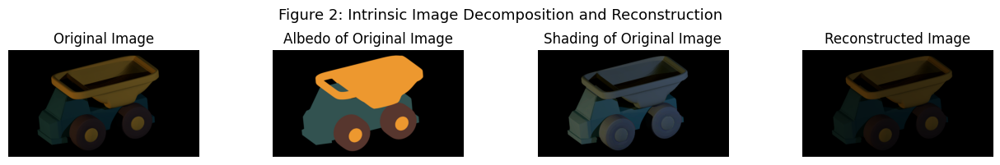

In [14]:
# Replace the object name with a valid name from the dataset
img_path = './intrinsic_images/'
object_name = 'truck_ml1'

# Read with opencv
obj = cv2.imread(img_path + object_name + '.png')
if obj is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name + ".png"}')
else:
    print(f'object shape: {obj.shape}')

obj_sha = cv2.imread(img_path + object_name + '_shad.png')
if obj_sha is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name + "_shad.png"}')
else:
    print(f'object albedo shape: {obj_sha.shape}')

obj_alb = cv2.imread(img_path + object_name.split('_')[0] + '_refl.png')
if obj_alb is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name.split("_")[0] + "_refl.png"}')
else:
    print(f'object shading shape: {obj_alb.shape}')

# YOUR CODE HERE
obj = cv2.cvtColor(obj, cv2.COLOR_BGR2RGB)
obj_alb_swap = cv2.cvtColor(obj_alb, cv2.COLOR_BGR2RGB)
obj_sha = cv2.cvtColor(obj_sha, cv2.COLOR_BGR2RGB)
iid_image = reconstruct_image_from_intrinsics(obj_alb_swap, obj_sha)

fig = plt.figure(figsize=(13,2))
fig.suptitle("Figure 2: Intrinsic Image Decomposition and Reconstruction", fontsize=13)

plt.subplot(1,4,1)
plt.title("Original Image")
plt.imshow(obj)
plt.axis("off")

plt.subplot(1,4,2)
plt.title("Albedo of Original Image")
plt.imshow(obj_alb_swap)
plt.axis("off")

plt.subplot(1,4,3)
plt.title("Shading of Original Image")
plt.imshow(obj_sha)
plt.axis("off")

plt.subplot(1,4,4)
plt.title("Reconstructed Image")
plt.imshow(iid_image)
plt.axis("off")

plt.tight_layout()
plt.show()

>Figure 2 shows four different images: the original image, its albedo, shading and reconstructed image. The reconstructed image matches the original image, showing that the equation I = R x S, which was shown in the lecture slides (HC2a), is validated, where I is the original/reconstructed image, R is the albedo, and S is the shading.

<a id="question-12"></a>
#### <font color='#FF0000'>Question 12 (2 points)</font>

Manipulating colors in photographs is an important problem with many applications in computer vision. Recoloring algorithms aim to manipulate colors effectively, and better results can be obtained if the albedo image is available as it is independent of confounding illumination effects.

First determine the true material color of the object you picked in RGB space (uniform color in this case). 

- Complete the code for the function `get_true_color()`.
- Plot the true color of the object in RGB space, make sure to also plot each channel separately. 

**Hint:** You can use `np.tile` to create a visualization of the true color.

In [15]:
def get_true_color(albedo_img):
    """
    Determines the true material color of the object in the albedo image.

    This function calculates the average RGB color in the albedo image, which represents the true material color of the object.

    Args:
        albedo_img: Albedo (reflectance) image

    Returns:
        true_colour: True material color of the object in RGB space
    """

    # YOUR CODE HERE
    mask = cv2.imread("intrinsic_images/truck_mask.png", cv2.IMREAD_GRAYSCALE)
    mask = mask > 0

    true_colour = albedo_img[mask].mean(axis=(0)) / 255
    return true_colour

[0.56420475 0.42000226 0.21995408]


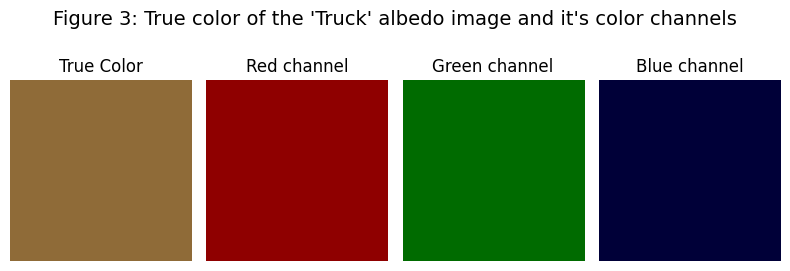

In [16]:
# get the true color of the object's albedo image
obj_alb_rgb = cv2.cvtColor(obj_alb, cv2.COLOR_BGR2RGB)
true_color = get_true_color(obj_alb_rgb)

# YOUR CODE
fig = plt.figure(figsize=(8,3))
fig.suptitle("Figure 3: True color of the 'Truck' albedo image and it's color channels", fontsize=14)

tile = np.tile(true_color, (100,100,1))
plt.subplot(1,4,1)
plt.title("True Color")
plt.imshow(tile)
plt.axis("off")
print(true_color)
red_img = np.zeros((100,100,3))
red_img[:,:,0] = true_color[0]
plt.subplot(1,4,2)
plt.title("Red channel")
plt.imshow(red_img)
plt.axis("off")

green_img = np.zeros((100,100,3))
green_img[:,:,1] = true_color[1]
plt.subplot(1,4,3)
plt.title("Green channel")
plt.imshow(green_img)
plt.axis("off")

blue_img = np.zeros((100,100,3))
blue_img[:,:,2] = true_color[2]
plt.subplot(1,4,4)
plt.title("Blue channel")
plt.imshow(blue_img)
plt.axis("off")

plt.tight_layout()
plt.show()

>Figure 3 shows the true color of the 'Truck' albedo image. This albedo image, shown in Figure 2, shows yellow/blue/brown-ish colors, which result in the true color shown here. This true color is obtained by first masking the object, so that the background is ignored when taking the true color of the object in the image, then by averaging the channel values of the object in the image. The colors of each averaged channel are also displayed alongside the true color.

<a id="question-13"></a>
#### <font color='#FF0000'>Question 13 (2 points)</font>

Assume you are given the PNG image and have access to its intrinsic albedo and shading images.

Recolor the object's image with pure red (255, 0, 0). Complete the code for the function `recolor_image()`. Display the recolored version of the object. Make sure to also plot each channel separately.

In [17]:
def recolor_image(albedo_img, shading_img):
    """
    Recolors an image based on its albedo and shading images.

    This function recolors the input albedo image by changing non-black pixels to red
    and then reconstructs the final image using the provided shading image.

    Args:
        albedo_img: Albedo (reflectance) image
        shading_img: Shading image

    Returns:
        recolored_img: Recolored and reconstructed image
    """

    # YOUR CODE HERE
    mask = cv2.imread("intrinsic_images/truck_mask.png", cv2.IMREAD_GRAYSCALE)
    mask = mask > 0
    alb_img = albedo_img.copy()
    alb_img[mask] = np.array([255,0,0], dtype=np.uint8)
    return reconstruct_image_from_intrinsics(alb_img, shading_img)


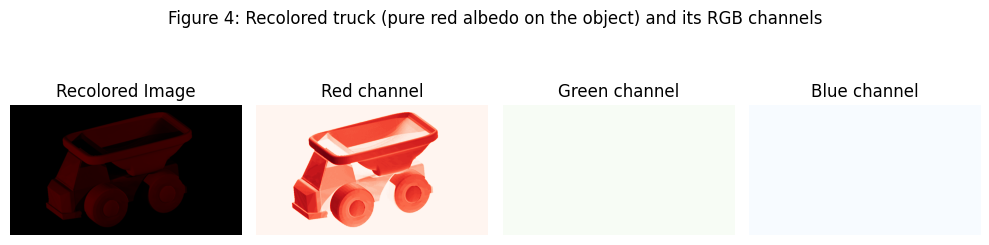

In [18]:
recolored_image = recolor_image(obj_alb, obj_sha)

# YOUR CODE HERE
fig = plt.figure(figsize=(10,3))
fig.suptitle("Figure 4: Recolored truck (pure red albedo on the object) and its RGB channels")
plt.subplot(1,4,1)
plt.title("Recolored Image")
plt.imshow(recolored_image)
plt.axis("off")

plt.subplot(1,4,2)
plt.title("Red channel")
plt.imshow(recolored_image[:,:,0], cmap="Reds")
plt.axis("off")

plt.subplot(1,4,3)
plt.title("Green channel")
plt.imshow(recolored_image[:,:,1], cmap="Greens")
plt.axis("off")

plt.subplot(1,4,4)
plt.title("Blue channel")
plt.imshow(recolored_image[:,:,2], cmap="Blues")
plt.axis("off")

plt.tight_layout()
plt.show()

>Figure 4 shows the recolored image, obtained by replacing the albedo of the object with pure red (255, 0, 0) and then applying I = R x S to reconstruct it. The recolored image has dark and bright red areas because of the original shading image, which contains shadows. The RGB channels are also plotted. The red channel is the only channel that shows the object, showing that the recoloring worked.

<a id="question-14"></a>
#### <font color='#FF0000'>Question 14 (2 points)</font>

Although you have recoloured the object with pure red, the reconstructed images do not seem to display those pure colors and thus the colour distributions over the object do not appear uniform. Explain the reason.

##### <font color='yellow'>Answer:</font>

>Even though the albedo was set to pure red, the reconstruction of the image multiplies the albedo with the shading of the photo. The shading has dark and bright areas from lightning, so the red looks darker in dark areas and brighter in bright areas instead of just appearing uniform red. The evidence for this can be seen in Question 11, where the shading image is seen with shadows. The lecture slides give the formula for reconstructing an image using the albedo and shading, so mathematically, the darker areas, with lower shading values multiply with the albedo and reduce the red intensity, while brighter areas with higher shading values increase the red intesity.

__Note:__  This was a simple case where the image is synthetic, object centered and has only one colour, and you have access to its ground-truth intrinsic images. Real world scenarios require more than just replacing a single colour with another, not to mention the complexity of achieving a decent intrinsic image decomposition.

<a id="section-4"></a>
### **Section 4: Photometric Stereo**

In this section, we delve into the photometric stereo technique, a method used to reconstruct a surface's shape from a set of images captured under varying lighting conditions. This approach is based on the principles outlined in Section 5.4 of Forsyth and Ponce's *Computer Vision: A Modern Approach*, which provides a comprehensive introduction to the theory and application of photometric stereo in computer vision.

Photometric stereo is particularly useful for capturing fine details of surface geometry. The core idea is to utilize an orthographic camera to take multiple images of a surface, each under different lighting conditions. By analyzing the variations in image intensity across these images, we can infer the surface normals and, subsequently, reconstruct the surface's height at each pixel, leading to what is commonly known as a height map or depth map.

The method assumes that the camera and the surface remain stationary, with illumination coming from different directions. By capturing enough images with different light source vectors, we can solve for the surface normals and albedo at each pixel.

<a id="question-15"></a>
#### <font color='#FF0000'>Question 15 (4 points)</font>

Start with the grayscale sphere model located in the SphereGray5 folder. The folder contains 5 images of a sphere with a grayscale checker texture under different lighting conditions. Your task is to estimate the surface reflectance (albedo) and surface normal of this model.

In this question, you will need to complete the function `estimate_albedo_and_normals()` to estimate the albedo and surface normal map for the SphereGray5 folder.

To assist you, two helper functions are provided:

- `load_synthetic_images()`: This function loads the synthetic images from the specified directory.
- `show_results()`: This function displays the albedo, surface normals, and optionally the height map and surface error.

These helper functions are provided to simplify the process of loading images and displaying your results.

**Hint**: To get the least-squares solution of a linear system, you can use the `numpy.linalg.lstsq` function.

Make sure to include images of your results in your notebook at key points. When visualizing 3D models, choose viewpoints that clearly illustrate the structure, and feel free to use multiple viewpoints if necessary.

In [19]:
def load_synthetic_images(image_dir='./photometrics_images/SphereGray5/', channel=0):
    """
    Loads synthetic images and their corresponding light source directions.

    This function reads all images from the specified directory, extracts the relevant channel, and stacks the images along the third dimension. It also extracts the light source directions from the image filenames and normalizes both the image stack and the light source vectors.

    Args:
        image_dir: directory containing the synthetic images
        channel: color channel to be extracted (default is 0, corresponding to the red channel)

    Returns:
        image_stack: a 3d numpy array of stacked images
        normalized_light_dirs: a 2d numpy array of normalized light source directions
    """
    # list all files in the image directory
    image_files = os.listdir(image_dir)
    num_images = len(image_files)

    image_stack = None
    light_directions = None
    
    # assumed z component for the light direction
    z_component = 0.5  

    # loop through all image files
    for i in range(num_images):
        # read the input image
        image = cv2.imread(os.path.join(image_dir, image_files[i]))
        image = np.flip(image, axis=-1)  # flip the image to correct the channel order
        image = image[:, :, channel]  # extract the specified color channel

        # initialize image stack and light direction array on the first iteration
        if image_stack is None:
            height, width = image.shape
            print('image size (h*w): %d*%d' % (height, width))
            image_stack = np.zeros([height, width, num_images], dtype=int)
            light_directions = np.zeros([num_images, 3], dtype=np.float64)

        # stack the image along the third dimension
        image_stack[:, :, i] = image

        # extract light direction from the image filename
        x_component = np.double(image_files[i][(image_files[i].find('_') + 1):image_files[i].rfind('_')])
        y_component = np.double(image_files[i][image_files[i].rfind('_') + 1:image_files[i].rfind('.png')])
        light_directions[i, :] = [x_component, -y_component, z_component]

    # convert the image stack to double precision for further processing
    image_stack = np.double(image_stack)

    # normalize the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)

    # handle the case where all pixel values are the same
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  

    # normalize the light direction vectors
    norm_factors = np.tile(np.sqrt(np.sum(light_directions ** 2, axis=1, keepdims=True)), (1, light_directions.shape[1]))
    normalized_light_dirs = light_directions / norm_factors

    return image_stack, normalized_light_dirs

In [20]:
def show_results(albedo, normals, titles, height_map=None, SE=None):
    """
    Displays the albedo, normals, and optionally the height map and surface error (SE).

    Args:
        albedo: albedo (reflectance) map
        normals: surface normal map
        height_map: reconstructed height map (optional)
        SE: surface error map (optional)
    """
    # stride in the plot, you may want to adjust it to different images
    stride = 1

    if albedo is not None:
        # showing albedo map
        fig = plt.figure(figsize=(5, 5))
        fig.suptitle(titles['albedo'], fontsize=14)
        albedo_max = 1  # normalize albedo values
        albedo = albedo / albedo_max
        print("Albedo shape:", albedo.shape)
        plt.imshow(albedo, cmap="gray")
        plt.title('Albedo Map', fontsize=16)
        plt.show()

    # showing normals as three separate channels
    figure = plt.figure(figsize=(10, 10))
    figure.suptitle(titles['normal'], fontsize=14)
    ax1 = figure.add_subplot(221)
    ax1.imshow(normals[..., 0], vmin=-1, vmax=1, cmap='viridis')
    ax1.set_axis_off()
    ax1.set_title('Normal Channel x', fontsize=16)
    ax2 = figure.add_subplot(222)
    ax2.imshow(normals[..., 1], vmin=-1, vmax=1, cmap='viridis')
    ax2.set_axis_off()
    ax2.set_title('Normal Channel y', fontsize=16)
    ax3 = figure.add_subplot(223)
    ax3.imshow(normals[..., 2], vmin=-1, vmax=1, cmap='viridis')
    ax3.set_axis_off()
    ax3.set_title('Normal Channel z', fontsize=16)
    ax4 = figure.add_subplot(224)
    ax4.imshow((normals + 1) * 0.5)
    ax4.set_axis_off()
    ax4.set_title('Combined Normals', fontsize=16)
    plt.show()

    # Create meshgrid for plotting 3D surfaces
    X, Y, _ = np.meshgrid(np.arange(0, np.shape(normals)[0], stride),
                          np.arange(0, np.shape(normals)[1], stride),
                          np.arange(1))
    X = X[..., 0]
    Y = Y[..., 0]

    # Show both heightmap and SE in a 1x2 subplot if they're available
    if height_map is not None and SE is not None:
        fig = plt.figure(figsize=(8, 4))
        fig.suptitle(titles['HSE'], fontsize=14)
        # Show heightmap
        ax1 = fig.add_subplot(1, 2, 1, projection='3d')
        H_height_map = height_map[::stride, ::stride]
        ax1.plot_surface(X, Y, H_height_map.T)
        ax1.set_title("Height Map")

        # Show SE
        ax2 = fig.add_subplot(1, 2, 2, projection='3d')
        H_SE = SE[::stride, ::stride]
        ax2.plot_surface(X, Y, H_SE.T, color='r')
        ax2.set_title("SE")

        plt.tight_layout()
        plt.show()

    # Only show heightmap if it's available
    elif height_map is not None:
        fig = plt.figure()
        fig.suptitle(titles['depth'], fontsize=14)
        ax = fig.add_subplot(projection='3d')
        H_height_map = height_map[::stride, ::stride]
        ax.plot_surface(X, Y, H_height_map.T)
        ax.set_title("Height Map")
        plt.show()

    # Only show SE if it's available
    elif SE is not None:
        fig = plt.figure()
        fig.suptitle(titles['SE'], fontsize=14)
        ax = fig.add_subplot(projection='3d')
        H_SE = SE[::stride, ::stride]
        ax.plot_surface(X, Y, H_SE.T, color='r')
        ax.set_title("SE")
        plt.show()

Following the guidelines in *Computer Vision: A Modern Approach* by Forsyth and Ponce, Chapter 5, Section 5.4, you will complete the `estimate_albedo_and_normals()` function by implementing the following steps:

1. **Iterate through each point in the image array**:
   - For each pixel, extract the intensity values across all images and stack them into a vector `i`.

2. **Construct the diagonal matrix**:
   - Construct the diagonal matrix `scriptI` using the vector `i`.

3. **Solve the linear system**:
   - Solve the equation `scriptI * scriptV * g = scriptI * i` to obtain the vector `g` for each pixel.

4. **Compute the albedo**:
   - The albedo at each pixel is the magnitude (norm) of the vector `g`, denoted as `|g|`.

5. **Compute the surface normal**:
   - The surface normal at each pixel is given by `g / |g|`, where `|g|` is non-zero.

In [21]:
def estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=True):
    """
    Estimates the surface albedo and normals from a stack of images.

    This function computes the albedo and surface normals for each pixel in the 
    image stack using the provided light source directions. Optionally, it applies 
    the shadow trick to improve the robustness of the solution.

    Args:
        image_stack: The stack of images of the surface, stacked along the third dimension.
        scriptV: The matrix containing the source and camera information.
        shadow_trick: Boolean indicating whether to use the shadow trick (default is True).

    Returns:
        albedo: The estimated surface albedo.
        normal: The estimated surface normals.
    """

    h, w, _ = image_stack.shape

    # create arrays for the albedo and normals
    albedo = np.zeros([h, w])
    normal = np.zeros([h, w, 3])

    # Solve g = albedo * normal for each pixel using least-squares.
    n_imgs = scriptV.shape[0]
    V = scriptV  # (n, 3)
    for y in range(h):
        for x in range(w):
            I = image_stack[y, x, :].astype(np.float64)  # (n,)
            if shadow_trick:
                W = np.diag(I)
                A = W @ V
                b = W @ I
            else:
                A = V
                b = I
            g, *_ = np.linalg.lstsq(A, b, rcond=None)
            a = np.linalg.norm(g)
            if a > 1e-8:
                albedo[y, x] = a
                normal[y, x, :] = g / a
            else:
                albedo[y, x] = 0.0
                normal[y, x, :] = 0.0
                
    return albedo, normal

image size (h*w): 512*512
Albedo shape: (512, 512)


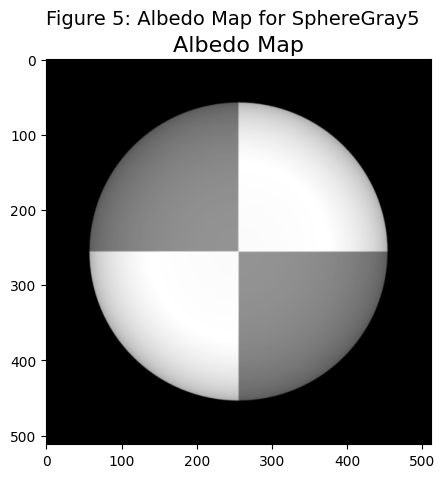

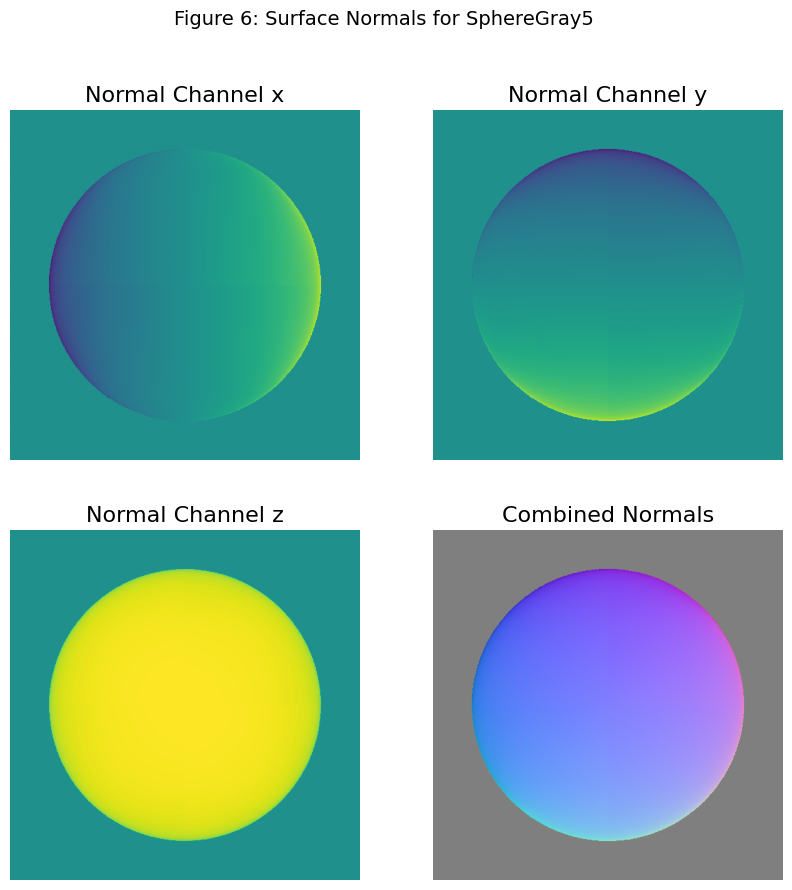

In [22]:
# load synthetic images for SphereGray5
image_stack, scriptV = load_synthetic_images('./photometrics_images/SphereGray5/')

# estimate albedo and normals
albedo_5, normals_5 = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=True)

# show results
titles = {
    "albedo": "Figure 5: Albedo Map for SphereGray5", 
    "normal": "Figure 6: Surface Normals for SphereGray5"
    }
show_results(albedo=albedo_5, normals=normals_5, titles=titles)

Figure 5 shows the albedo for the SphereGray5 dataset, showing intrinstic surface properties with a checkerboard pattern.

Figure 6 shows the surface normals for the SphereGray5 dataset. These are shown as seperate x/y/z channels and a combined visualization.

<a id="question-16"></a>
#### <font color='#FF0000'>Question 16 (2 points)</font>

After implementing the `estimate_albedo_and_normals()` function, what do you expect to see in the albedo image? How does this compare to your actual result? Explain the differences.

##### <font color='yellow'>Answer:</font>

>Ideally, the albedo map shows only intrinsic reflectance, so, a crisp checkerboard with constant-valued squares, independent of lighting and shape. In actual result seen in Figure 5 and 6 we can see the pattern but see residual shading gradients (especially toward the rim).

<a id="question-17"></a>
#### <font color='#FF0000'>Question 17 (1 point)</font>

In principle, what is the minimum number of images you need to estimate the albedo and surface normal? Explain your reasoning.

##### <font color='yellow'>Answer:</font>

>Three images (with linearly independent lighting directions) is the minimum. This is also seen in Figure 6, where there are three directions needed to create the combined normals visualization. At each pixel you solve $I=V\space g$ for $g = \rho \space n \in \mathbb{R}^3$. we need at least $3$ independent equations (images) so $rank(V)=3$ and $g$ is uniquely determined. With only $2$ images you have infinitely many solutions. More than $3$ images let us do a least-squares fit, making the estimate more robust to noise, shadows, and non-Lambertian effects. Also, the chosen three must not be shadowed at that pixel, otherwise the system becomes ill-conditioned.

<a id="question-18"></a>
#### <font color='#FF0000'>Question 18 (2 points)</font>

Now, run the algorithm with more images by using the SphereGray25 folder. Observe the differences in the results when using more images. Report your findings. 

You could try all images at once or a few at a time, incrementally. Choose a strategy and justify it by discussing your results.

image size (h*w): 512*512
Albedo shape: (512, 512)


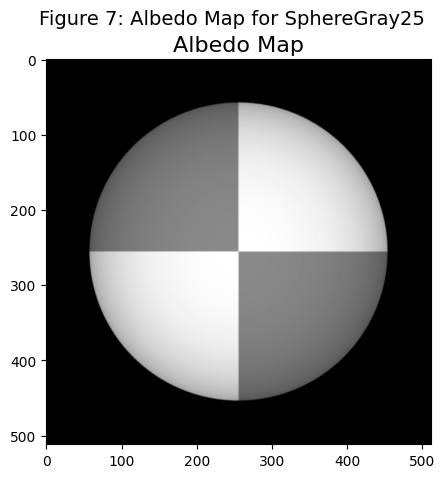

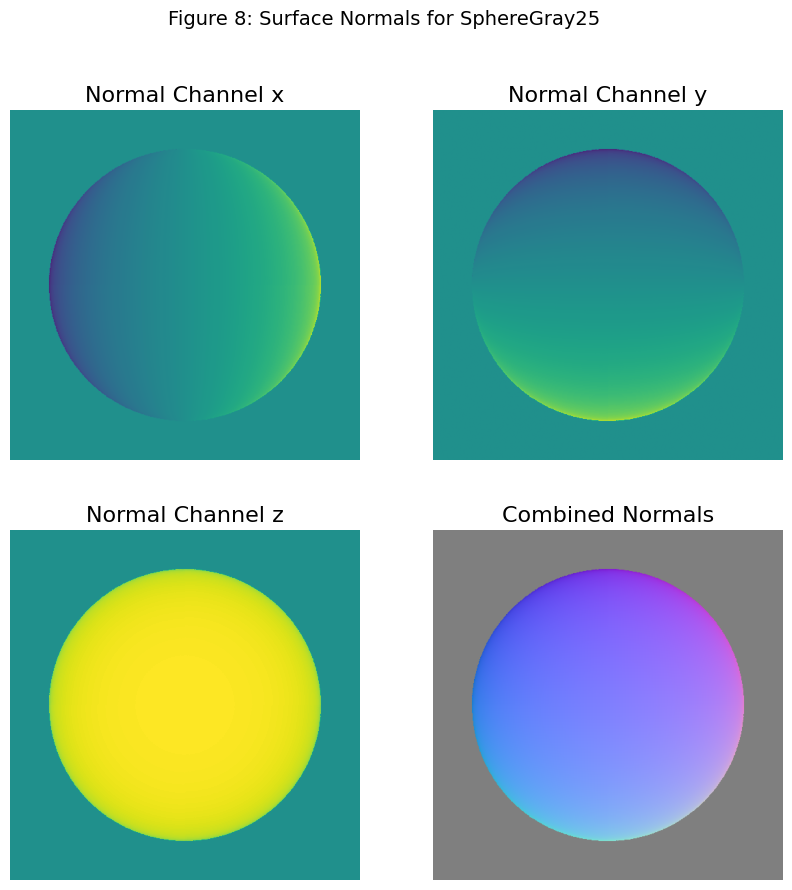

In [23]:
# load synthetic images for SphereGray25
image_stack25, scriptV25 = load_synthetic_images('./photometrics_images/SphereGray25/')

# estimate albedo and normals for SphereGray25
albedo_25, normals_25 = estimate_albedo_and_normals(image_stack25, scriptV25, shadow_trick=True)

# show the results for SphereGray25
titles = {
    "albedo": "Figure 7: Albedo Map for SphereGray25", 
    "normal": "Figure 8: Surface Normals for SphereGray25"
    }
show_results(albedo=albedo_25, normals=normals_25, titles=titles)

Figure 7 shows the albedo for the SphereGray25 dataset, showing intrinstic surface properties with a checkerboard pattern.

Figure 8 shows the surface normals for the SphereGray25 dataset. These are shown as seperate x/y/z channels and a combined visualization.

##### <font color='yellow'>Answer:</font>

>With 25 images the results look almost the same as with 5 (seen in Figure 6): In Figure 7 and 8 we can see that the albedo is clean and the normals are smooth. This might be because of the fact that the sphere is simple (near-Lambertian), noise is low, the 5 lights are well spread, and the shadow trick already down-weights bad pixels. 

<a id="question-19"></a>
#### <font color='#FF0000'>Question 19 (2 points)</font>

Consider the impact of shadows in photometric stereo. Explain the trick mentioned in the textbook to deal with shadows.

Remove this trick from your implementation and check your results. Is the trick necessary when using 5 images? How about when using 25 images?

image size (h*w): 512*512
image size (h*w): 512*512
SphereGray5 without shadow trick
Albedo shape: (512, 512)


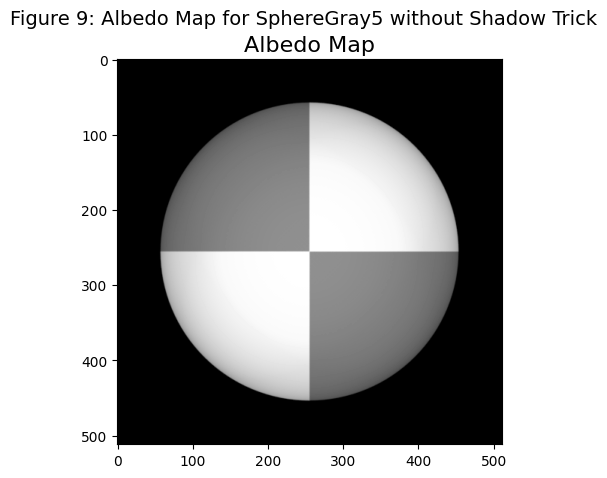

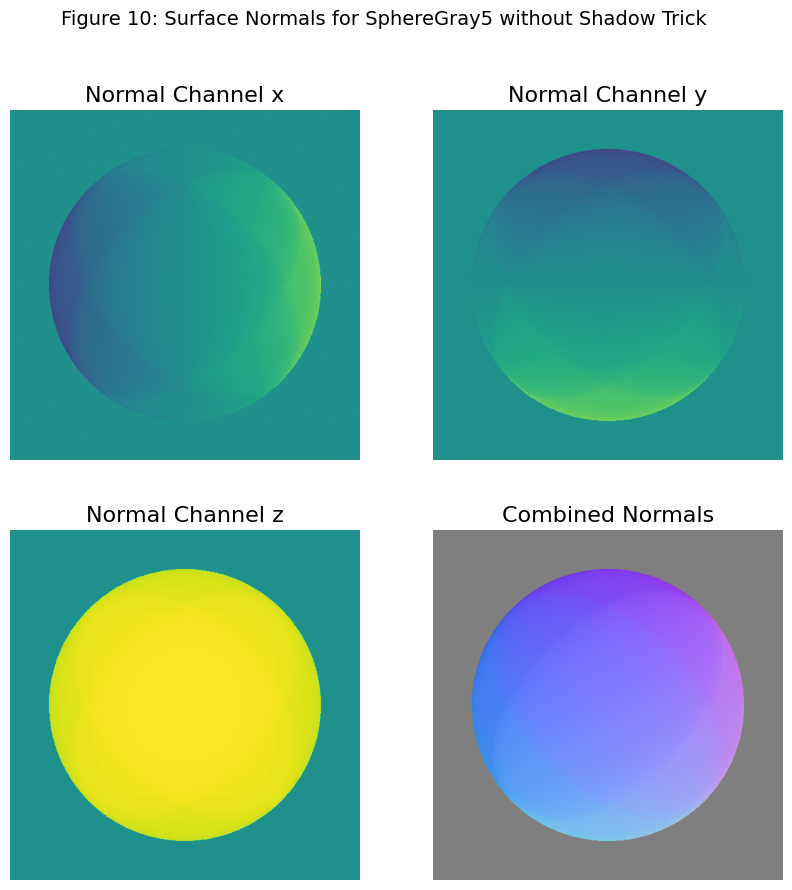

SphereGray25 without shadow trick
Albedo shape: (512, 512)


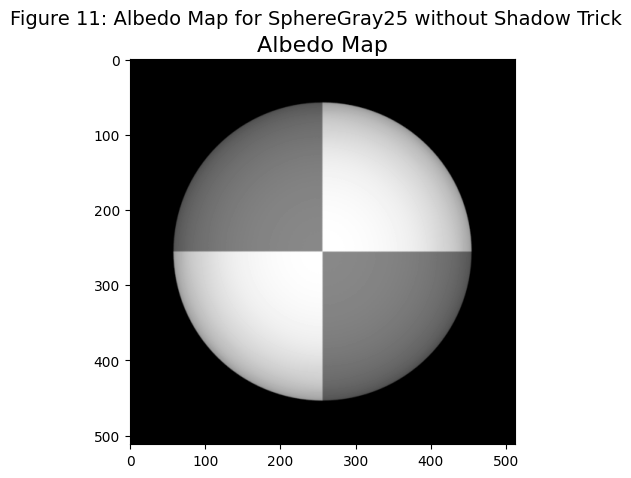

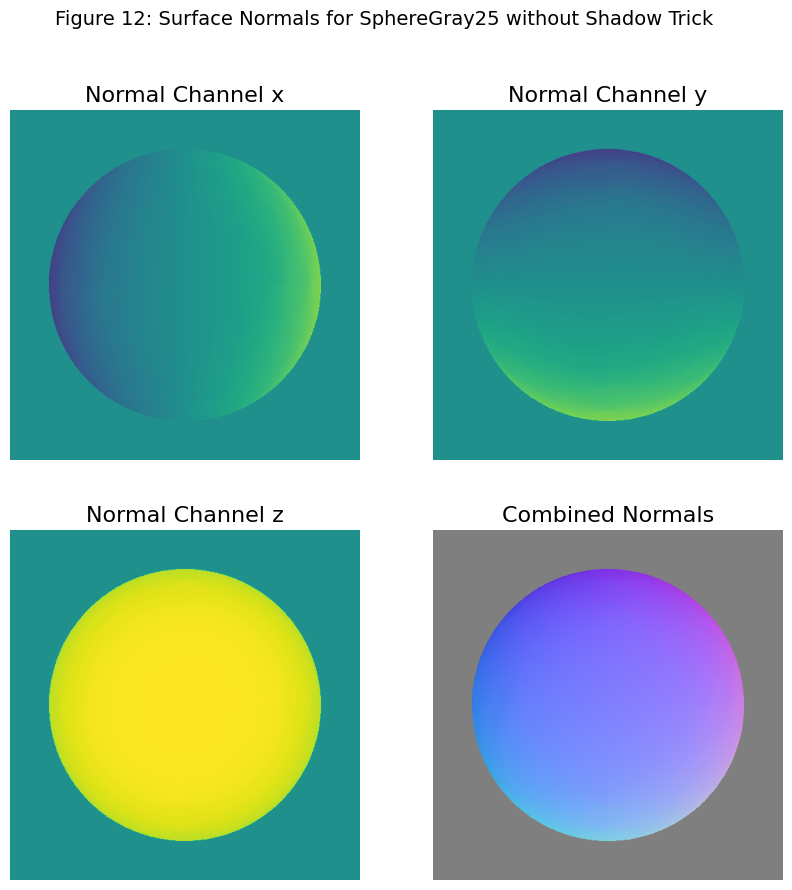

In [24]:
# load synthetic images for SphereGray5 and SphereGray25
img5, V5 = load_synthetic_images('./photometrics_images/SphereGray5/')
img25, V25 = load_synthetic_images('./photometrics_images/SphereGray25/')

# estimate albedo and normals without shadow trick
alb5_ns, normals_s5 = estimate_albedo_and_normals(img5, V5, shadow_trick=False)
alb25_ns, normals_s25 = estimate_albedo_and_normals(img25, V25, shadow_trick=False)

# show results without shadow trick
print("SphereGray5 without shadow trick")
titles = {
    "albedo": "Figure 9: Albedo Map for SphereGray5 without Shadow Trick",
    "normal": "Figure 10: Surface Normals for SphereGray5 without Shadow Trick"
}
show_results(albedo=alb5_ns, normals=normals_s5, titles=titles)

print("SphereGray25 without shadow trick")
titles = {
    "albedo": "Figure 11: Albedo Map for SphereGray25 without Shadow Trick",
    "normal": "Figure 12: Surface Normals for SphereGray25 without Shadow Trick"
}
show_results(albedo=alb25_ns, normals=normals_s25, titles=titles)

Figure 9 shows the albedo for the SphereGray5 dataset without the shadow trick, showing intrinstic surface properties with a checkerboard pattern.

Figure 10 shows the surface normals for the SphereGray5 dataset without the shadow trick. These are shown as seperate x/y/z channels and a combined visualization. The normals have an oval shape.

Figure 11 shows the albedo for the SphereGray25 dataset without the shadow trick, showing intrinstic surface properties with a checkerboard pattern.

Figure 12 shows the surface normals for the SphereGray25 dataset without the shadow trick. These are shown as seperate x/y/z channels and a combined visualization. These look the same compared to the surface normals that do use the shadow trick.

##### <font color='yellow'>Answer:</font>

>When we use 5 lights, we can clearly see (in Figure 9) that the albedo map doesn't differ that much, however with normals (Figure 10) we can clearly see that they are not smooth, there is a clear oval shapes in the diagonal directions of the circle, which might be an indicator that there was not enough lights to estimate a sufficient normal. With 25 lights (Figure 11 and 12), we can observe no real difference with what have been seen in previous plots with application of shadow trick. Therefore we can conclude that shadow trick is meaningful when there is not high amount of lights even if they are well spread. In case with a relatively high amount of lights, the shadow trick is not that necessary.

>In photometric stereo, shadowed views give intensities near zero and violate the linear model. The shadow trick solves a weighted least-squares system where each image’s equation is multiplied by its measured intensity: $min||diag(I)(Vg-I)||^2$. Rows with $I_k\approx 0$ (shadows) are down-weighted to almost nothing, so they don’t corrupt the estimate for $g=\rho n$.


<a id="question-20"></a>
#### <font color='#FF0000'>Question 20 (5 points)</font>

Before reconstructing the surface height map, it is necessary to compute the partial derivatives, $\frac{\partial f}{\partial x}$ and $\frac{\partial f}{\partial y}$ (referred to as *p* and *q* in the algorithm). These partial derivatives also allow for a double-check of the computation through a test of *integrability*.

In this question, you will need to complete the function `check_integrability()` to compute the partial derivatives *p* and *q*.

Make sure to verify your results by examining the integrability of the computed derivatives.

In [25]:
def check_integrability(normals):
    """
    Checks the surface gradient for integrability.

    This function computes the partial derivatives of the surface function with respect to x and y 
    (p and q), and calculates the squared errors of the mixed partial derivatives to test for integrability.

    Args:
        normals: The normal map of the surface.

    Returns:
        p: The partial derivative of the surface function with respect to x (df/dx).
        q: The partial derivative of the surface function with respect to y (df/dy).
        SE: The squared errors of the mixed partial derivatives.
    """

    # initialize p, q, and SE
    p = np.zeros(normals.shape[:2])
    q = np.zeros(normals.shape[:2])
    SE = np.zeros(normals.shape[:2])

    eps = 1e-8
    nz = normals[..., 2] + eps
    p = normals[..., 0] / nz   # df/dx
    q = normals[..., 1] / nz   # df/dy

    # Compute mixed partial derivatives and their squared error.
    # np.gradient returns (d/dy, d/dx) for 2D arrays.
    dp_dy, dp_dx = np.gradient(p)
    dq_dy, dq_dx = np.gradient(q)
    SE = (dp_dy - dq_dx) ** 2
    return p, q, SE

In [26]:
# Use the normals that you found in the previous question
p, q, SE = check_integrability(normals_s5)

print('Showing the integrability check results for 5 light sources:')
print(f'SE max: {SE.max()}\n')

p, q, SE = check_integrability(normals_s25)

print('Showing the integrability check results for 25 light sources:')
print(f'SE max: {SE.max()}')

Showing the integrability check results for 5 light sources:
SE max: 0.2903892865274933

Showing the integrability check results for 25 light sources:
SE max: 0.2429039841501377


<a id="question-21"></a>
#### <font color='#FF0000'>Question 21 (3 points)</font>

Implement and compute the partial derivatives according to the provided algorithm, and perform the test of integrability by applying a reasonable threshold to the squared errors. 

Reflect on the potential causes of any errors observed. Additionally, analyze how the test of integrability performs when using the GraySphere5 and GraySphere25 datasets. Use the normal maps obtained from the previous steps with the shadow trick applied.

image size (h*w): 512*512
image size (h*w): 512*512

GraySphere5
[GraySphere5] 95th-pct threshold: 1.6784e-05 | outliers: 13108/262144 (5.00%)
[GraySphere5] SE stats (finite): mean=1.2214e-03, median=0.0000e+00, p95=1.6784e-05
Albedo shape: (512, 512)


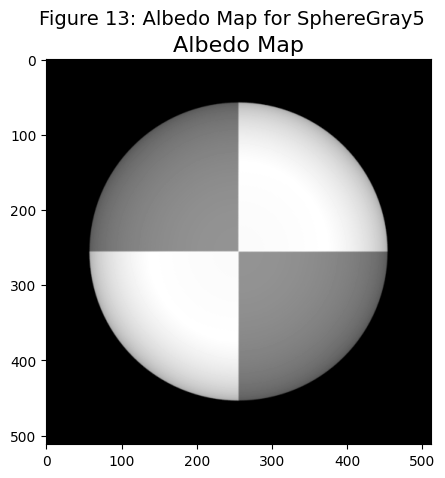

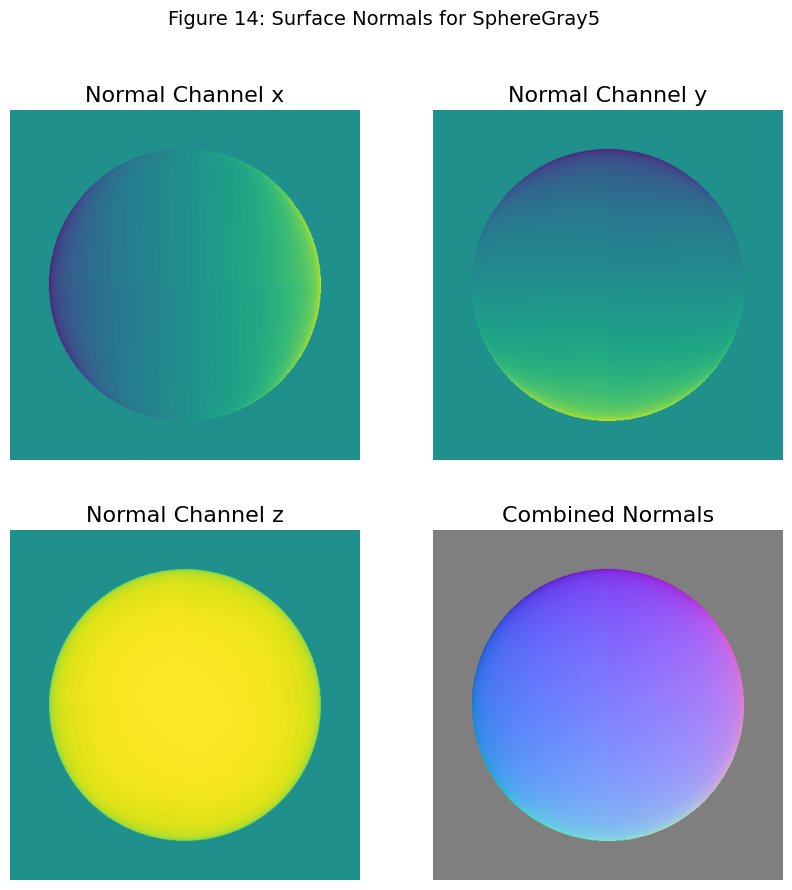

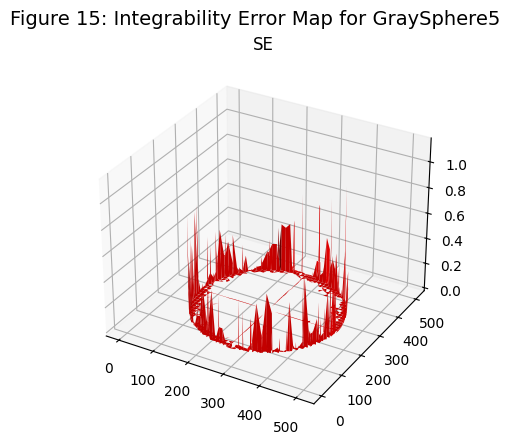

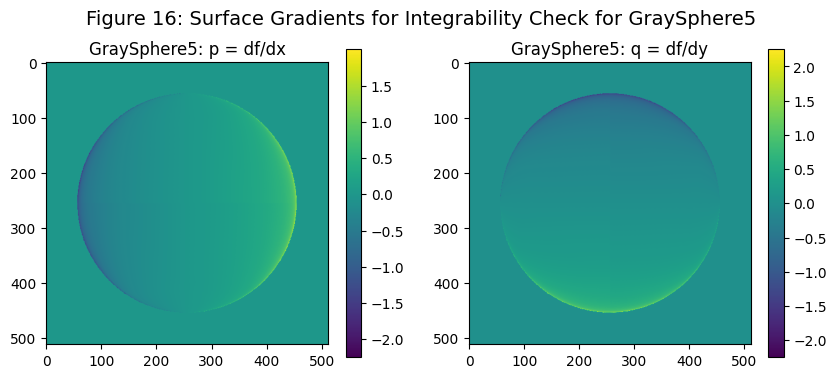

{'threshold': 1.6784349728611804e-05, 'outliers': 13108, 'total': 262144, 'outlier_pct': 5.00030517578125, 'se_mean': 0.0012214183124071997, 'se_median': 0.0, 'se_p95': 1.6784349728611804e-05}

GraySphere25
[GraySphere25] 95th-pct threshold: 2.8489e-06 | outliers: 13108/262144 (5.00%)
[GraySphere25] SE stats (finite): mean=5.5255e-04, median=0.0000e+00, p95=2.8489e-06
Albedo shape: (512, 512)


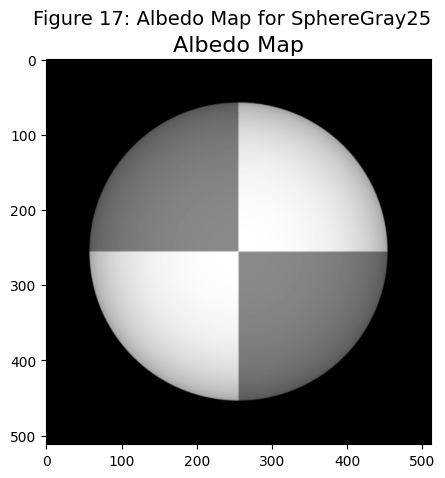

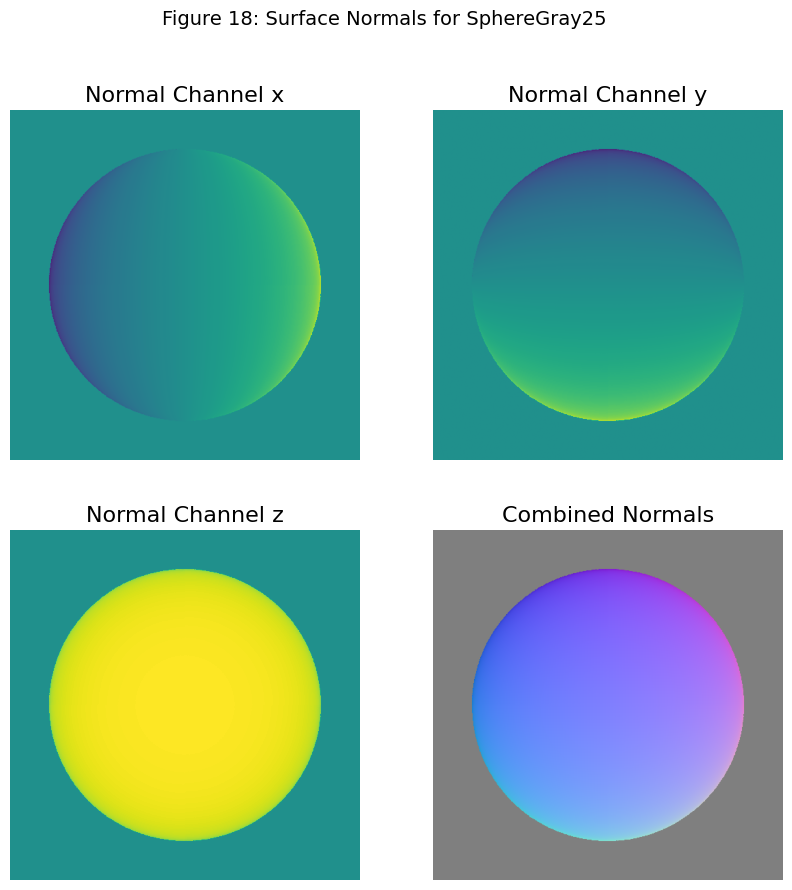

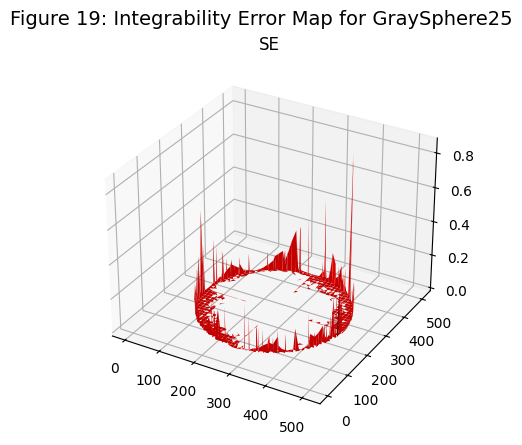

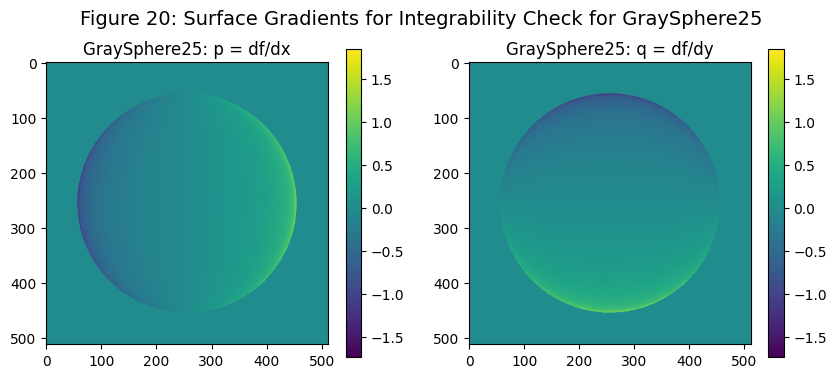

{'threshold': 2.8489189780551676e-06, 'outliers': 13108, 'total': 262144, 'outlier_pct': 5.00030517578125, 'se_mean': 0.0005525533892270635, 'se_median': 0.0, 'se_p95': 2.8489189780551676e-06}


In [27]:
# Q21 — Integrability test on GraySphere5 & GraySphere25 (shadow_trick=True)

def integrability_report(normals, albedo, label, titles):
    p, q, SE = check_integrability(normals)
    finite = np.isfinite(SE)
    thr = np.percentile(SE[finite], 95.0) if np.any(finite) else 0.0
    n_out = int(np.sum(SE > thr)); n_all = int(np.sum(finite))
    pct = (100.0 * n_out / n_all) if n_all > 0 else 0.0

    print(f"[{label}] 95th-pct threshold: {thr:.4e} | outliers: {n_out}/{n_all} ({pct:.2f}%)")
    print(f"[{label}] SE stats (finite): mean={np.nanmean(SE):.4e}, "
          f"median={np.nanmedian(SE):.4e}, p95={np.nanpercentile(SE,95):.4e}")

    SE_vis = SE.copy(); SE_vis[SE_vis <= thr] = float('nan')
    show_results(albedo, normals, titles=titles, SE=SE_vis)

    fig, ax = plt.subplots(1,2,figsize=(10,4))
    fig.suptitle(titles['integrability'], fontsize=14)
    im0=ax[0].imshow(p, cmap='viridis'); ax[0].set_title(f"{label}: p = df/dx"); fig.colorbar(im0, ax=ax[0])
    im1=ax[1].imshow(q, cmap='viridis'); ax[1].set_title(f"{label}: q = df/dy"); fig.colorbar(im1, ax=ax[1])
    plt.show()

    return {"threshold": float(thr),"outliers": n_out,"total": n_all,"outlier_pct": float(pct),
            "se_mean": float(np.nanmean(SE)),"se_median": float(np.nanmedian(SE)),
            "se_p95": float(np.nanpercentile(SE,95))}

# Prepare normals/albedos (reuse if present; otherwise compute)
try:
    A5, N5
except:
    img5, V5 = load_synthetic_images('./photometrics_images/SphereGray5/')
    A5, N5 = estimate_albedo_and_normals(img5, V5, shadow_trick=True)

try:
    A25, N25
except:
    img25, V25 = load_synthetic_images('./photometrics_images/SphereGray25/')
    A25, N25 = estimate_albedo_and_normals(img25, V25, shadow_trick=True)

print("\nGraySphere5")
titles = {
    "albedo": "Figure 13: Albedo Map for SphereGray5",
    "normal": "Figure 14: Surface Normals for SphereGray5",
    "SE": "Figure 15: Integrability Error Map for GraySphere5",
    "integrability": "Figure 16: Surface Gradients for Integrability Check for GraySphere5"
}
stats5 = integrability_report(normals=N5, albedo=A5, label="GraySphere5", titles=titles)
print(stats5)
print("\nGraySphere25")
titles = {
    "albedo": "Figure 17: Albedo Map for SphereGray25",
    "normal": "Figure 18: Surface Normals for SphereGray25",
    "SE": "Figure 19: Integrability Error Map for GraySphere25",
    "integrability": "Figure 20: Surface Gradients for Integrability Check for GraySphere25"
}
stats25 = integrability_report(N25, A25, "GraySphere25", titles=titles)
print(stats25)

Figure 13 shows the albedo for the SphereGray5, showing intrinstic surface properties with a checkerboard pattern.

Figure 14 shows the surface normals for the SphereGray5 dataset. These are shown as seperate x/y/z channels and a combined visualization.

Figure 15 shows the Surface Error on the SphereGray5 dataset. These errors (with high noise) are around the edges of the sphere.

Figure 16 shows the partial derivatives of surface normals for the SphereGray5 dataset. The left plot shows the horizontal gradients, and the right plot shows the vertical gradients.

Figure 17 shows the albedo for SphereGray25, showing intrinsic surface properties with a checkerboard pattern.

Figure 18 shows the surface normals for the SphereGray25 dataset. These are shown as seperate x/y/z channels and a combined visualization.

Figure 19 shows the Surface Error on the SphereGray25 dataset. These errors (with high noise) are around the edges of the sphere.

Figure 20 shows the partial derivatives of surface normals for the SphereGray25 dataset. The left plot shows the horizontal gradients, and the right plot shows the vertical gradients.

##### <font color='yellow'>Answer:</font>

>In both sets, SE spikes concentrate in a ring at the silhouette and a few tiny interior speckles (as shown in Figure 15 and 19). GraySphere25 shows smoother $p$ and $q$ fields and a lower SE (see Figure 16 and 20). Albedo/normal maps look clean and consistent in the 25 light case is probably just a little bit less noisy, as seen when comparing Figure 14 and 18.

>Near the rim $n_z$ goes to 0 therefore p,q blow up, finite differences also cross object/background, producing the ring of high SE. Also, because of discrete differentiation, numeric gradients magnify small local normal errors. The shadow trick down-weights dark pixels but can’t remove all violations; any mismatch in light directions/normalization also raises SE. 

>Therefore using 25 lights significantly improves integrability, SE distributions shift closer to zero (lower mean and p95), and $p,q$ are visually smoother. The identical 5% outlier rate is a consequence of the chosen percentile threshold, the real improvement is evident in the reduced SE magnitudes and cleaner fields with GraySphere25.

<a id="question-22"></a>
#### <font color='#FF0000'>Question 22 (6 points)</font>

To reconstruct the surface height map, you need to integrate the partial derivatives over a path. Since we are working with discrete structures, this integration is done by summing their values.

The algorithm presented in the chapter suggests performing the integration in a column-major order: start at the top-left corner, integrate along the first column, and then proceed to the right along each row. However, it is also recommended to use multiple paths and average the results to help distribute the errors from derivative estimates.

In this question, you will:

1. Construct the surface height map using column-major order as described in the algorithm.
2. Implement the row-major path integration method.

Your implementation should be added to the `construct_surface()` function.

**Note**: By default, Numpy uses row-major operations. If you unroll an image to linearize the operation, you will end up with a row-major representation. Numpy can be configured to use column-major order, but this concern does not apply if you are using double for-loops without unrolling.

**Hint**: To further inspect the shape of the objects and normal directions, consider using the `matplotlib.pyplot.quiver` function. Be sure to choose appropriate sub-sampling ratios for proper illustration. Add this to the `show_results()` function if needed.

In [28]:
def construct_surface(p, q, path_type='column'):
    """
    Constructs the surface function represented as height_map.

    This function integrates the partial derivatives p and q to reconstruct the surface height map.
    The integration can be done along a column-major, row-major, or an averaged path.

    Args:
        p: The partial derivative of the surface function with respect to x (df/dx).
        q: The partial derivative of the surface function with respect to y (df/dy).
        path_type: The type of path to construct the height_map, either 'column', 'row', or 'average'.

    Returns:
        height_map: The reconstructed surface height map.
    """

    h, w = p.shape
    height_map = np.zeros([h, w])

    if path_type == 'column':
        p = -p
        q = -q
        height_map[0, 0] = 0.0
        # First column: cumulative sum of q along rows
        for y in range(1, h):
            height_map[y, 0] = height_map[y - 1, 0] + q[y, 0]
        # Each row: cumulative sum of p along columns
        for y in range(0, h):
            for x in range(1, w):
                height_map[y, x] = height_map[y, x - 1] + p[y, x]

    elif path_type == 'row':
        p = -p
        q = -q
        height_map[0, 0] = 0.0
        # First row: cumulative sum of p along columns
        for x in range(1, w):
            height_map[0, x] = height_map[0, x - 1] + p[0, x]
        # Each column: cumulative sum of q along rows
        for x in range(0, w):
            for y in range(1, h):
                height_map[y, x] = height_map[y - 1, x] + q[y, x]
                
    elif path_type == 'average':
        height_col = construct_surface(p, q, path_type='column')
        height_row = construct_surface(p, q, path_type='row')
        height_map = 0.5 * (height_col + height_row)
        
    return height_map

Showing the surface reconstruction results for 5 light sources using column-major integration:


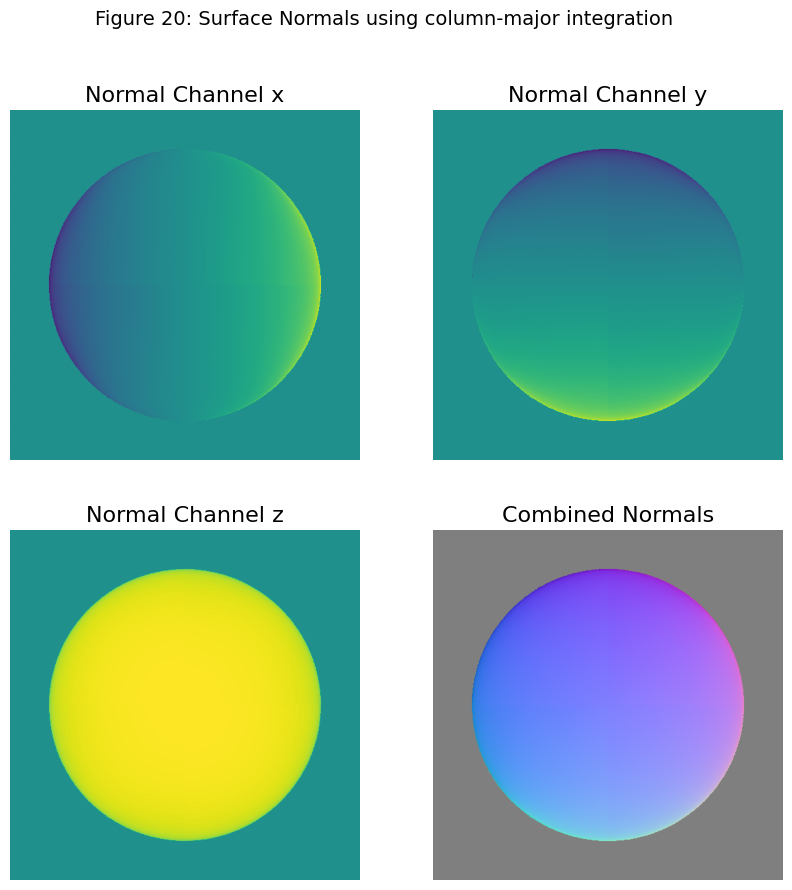

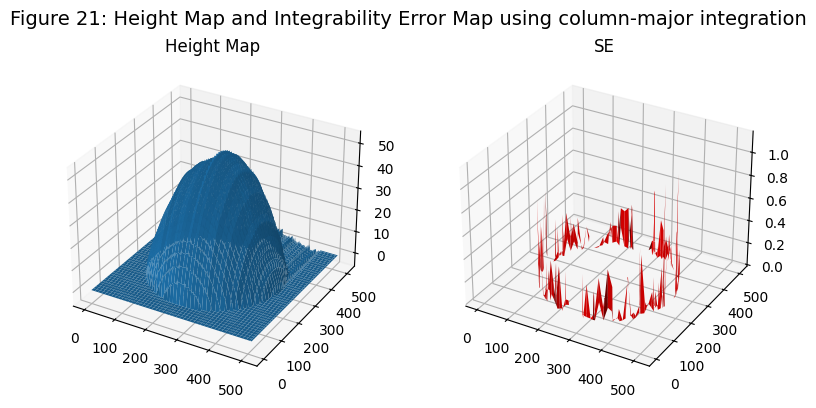

In [29]:
p, q, SE = check_integrability(normals_5)

height_map = construct_surface(p, q, "column")

# set the threshold for visualization
threshold = 0.01
SE[SE <= threshold] = float('nan')

print('Showing the surface reconstruction results for 5 light sources using column-major integration:')
titles = {
    "normal": "Figure 20: Surface Normals using column-major integration",
    "HSE": "Figure 21: Height Map and Integrability Error Map using column-major integration"
}
show_results(albedo=None, normals=normals_5, titles=titles, height_map=height_map, SE=SE)

Figure 20 shows the surface normals using column-major integration, showed as separate x/y/z channels and a combined visualization.

Figure 21 shows the height map and integrability error using column-major integration, with errors mostly around the edges of the sphere.

<a id="question-23"></a>
#### <font color='#FF0000'>Question 23 (2 points)</font>

Compare the results obtained from the two different integration paths (column-major and row-major). 

What are the differences in the reconstructed surface height maps when using these two paths? Discuss any observations you notice between the two approaches.

Showing column-major reconstruction:


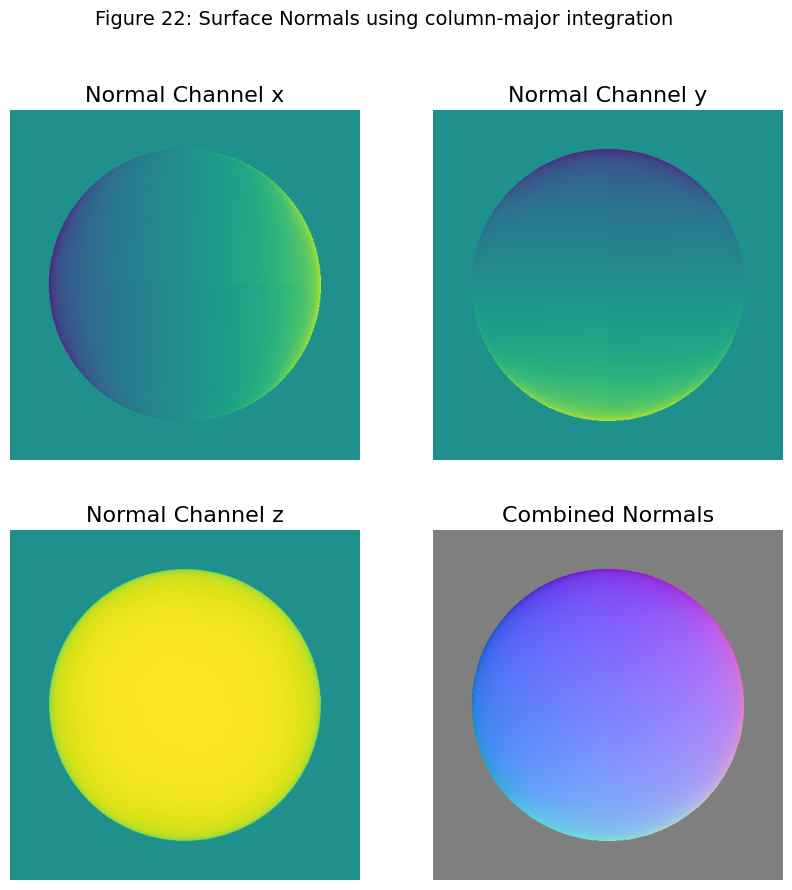

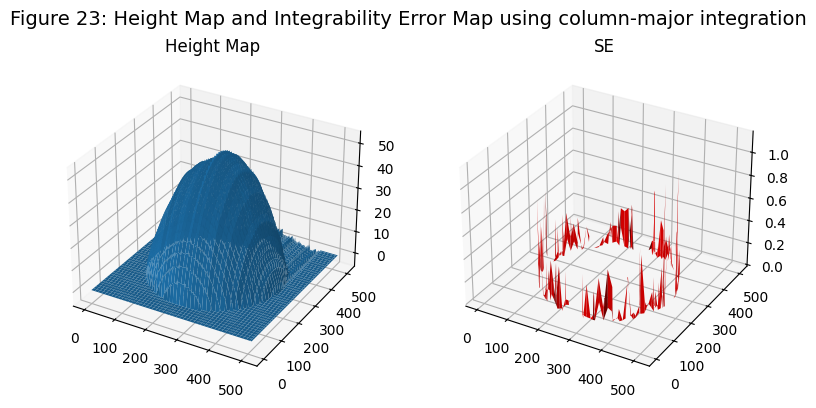

Showing row-major reconstruction:


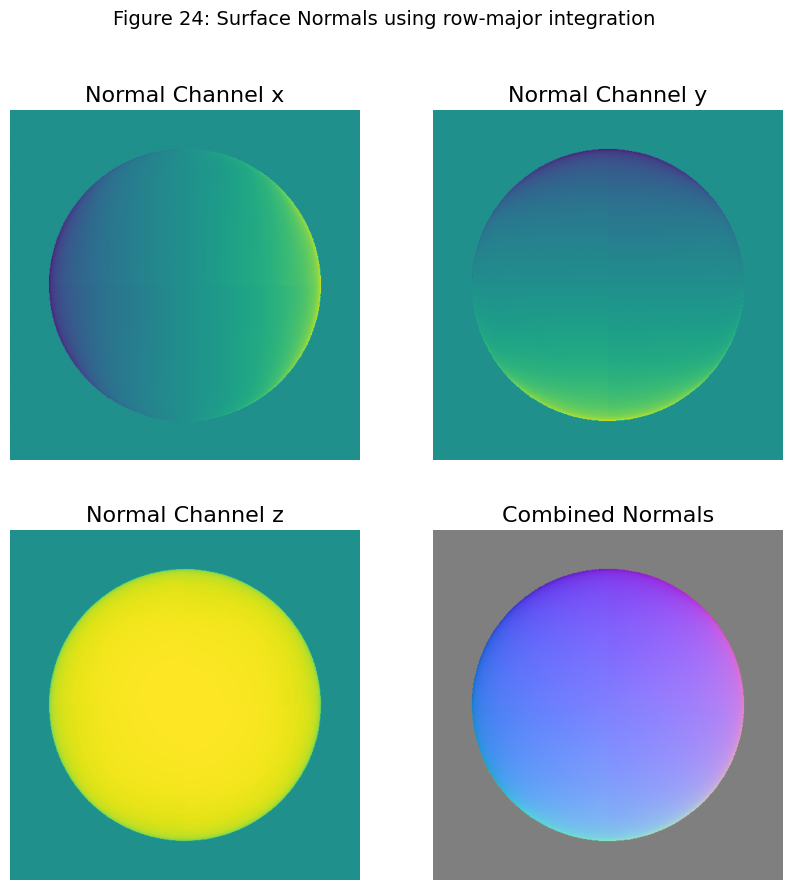

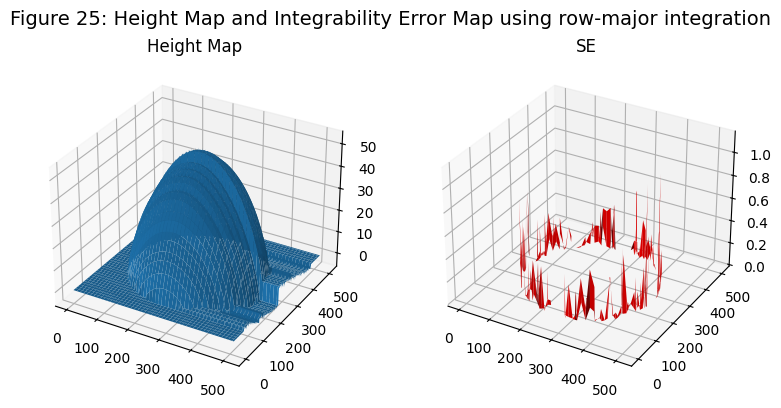

In [30]:
# Reuse p and q from integrability step (compute if needed)
N = normals_5
A = albedo_5

p, q, _ = check_integrability(N)

H_col = construct_surface(p, q, path_type='column')
H_row = construct_surface(p, q, path_type='row')

# set the threshold for visualization
threshold = 0.01
SE[SE <= threshold] = float('nan')


print("Showing column-major reconstruction:")
titles = {
    "normal": "Figure 22: Surface Normals using column-major integration",
    "HSE": "Figure 23: Height Map and Integrability Error Map using column-major integration"
}
show_results(albedo=None, normals=N, titles=titles, height_map=H_col, SE=SE)

print("Showing row-major reconstruction:")
titles = {
    "normal": "Figure 24: Surface Normals using row-major integration",
    "HSE": "Figure 25: Height Map and Integrability Error Map using row-major integration"
}
show_results(albedo=None, normals=N, titles=titles, height_map=H_row, SE=SE)

Figure 22 shows the surface normals using column-major integration, showed as separate x/y/z channels and a combined visualization.

Figure 23 shows the height map and integrability error using column-major integration, with errors mostly around the edges of the sphere.

Figure 24 shows the surface normals using row-major integration, showed as separate x/y/z channels and a combined visualization.

Figure 25 shows the height map and integrability error using row-major integration, with errors mostly around the edges of the sphere.

##### <font color='yellow'>Answer:</font>

>The height maps differ by path-aligned drift, column-major exhibits vertical seams/corrugation (see Figures 22 and 23), row-major shows horizontal ones (see Figures 24 and 25). These differences come from accumulated summation error when integrating a noisy, non-perfectly-integrable $(p,q)$ field (especially near the silhouette where $n_z$ is small).

<a id="question-24"></a>
#### <font color='#FF0000'>Question 24 (2 points)</font>

Now, take the average of the results obtained from the column-major and row-major integration paths.

Do you observe any improvement compared to using only one path? Additionally, analyze whether the construction results vary when using different numbers of images in the reconstruction process. (So compare the results obtained from the GraySphere5 and GraySphere25 datasets.)

GraySphere5 (average path integration):


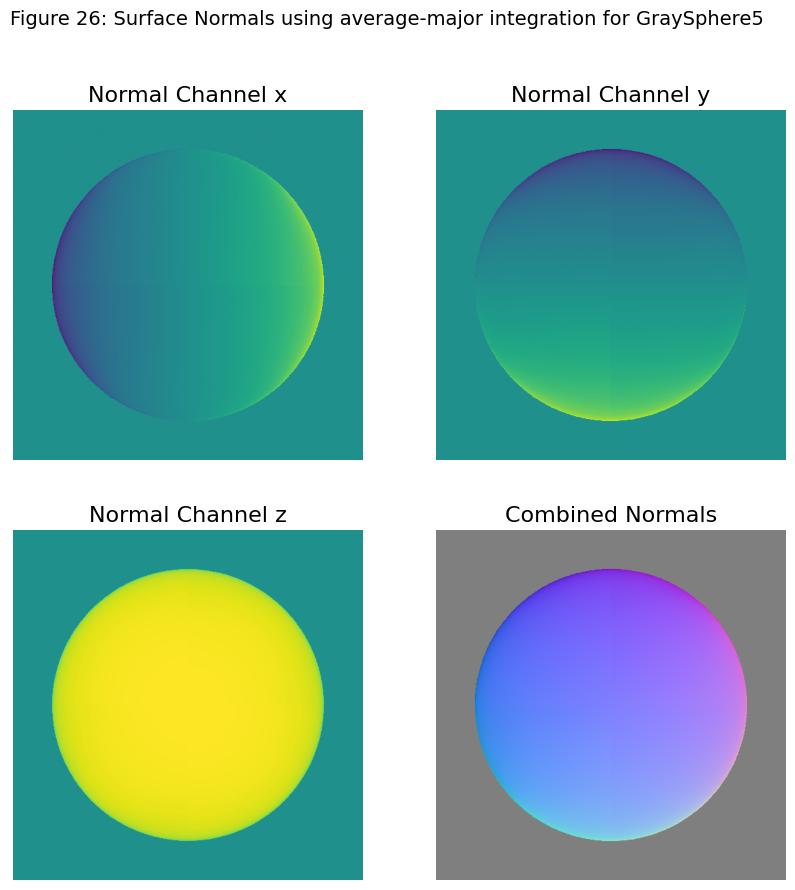

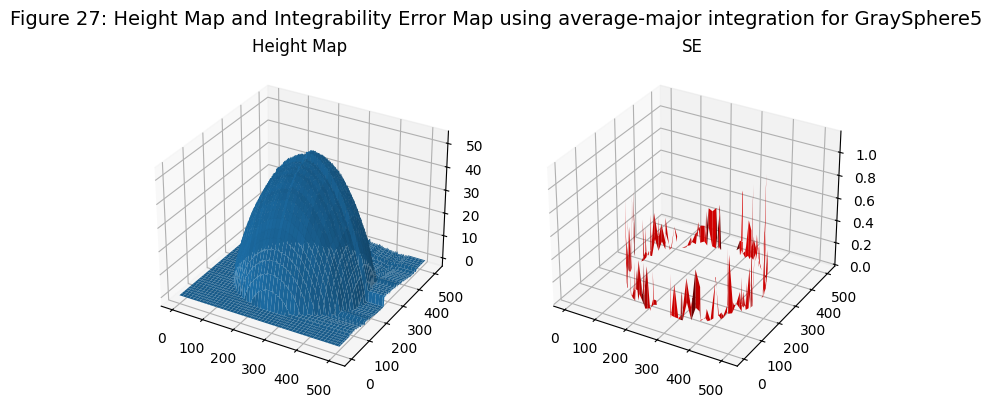

GraySphere25 (average path integration):


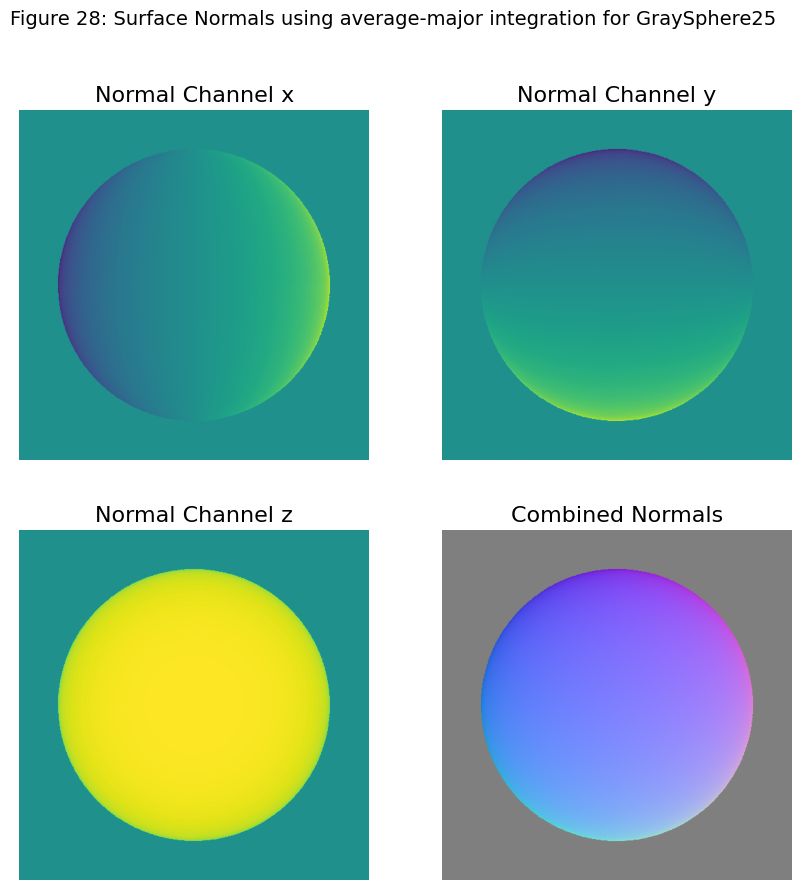

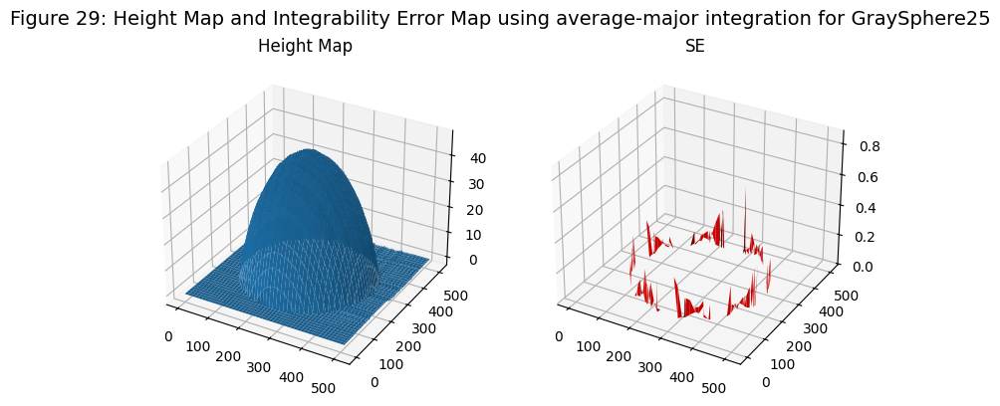

In [31]:
# GraySphere5 average reconstruction
N5 = normals_5
A5 = albedo_5

p5, q5, SE5 = check_integrability(N5)

# Average path reconstruction
H5_avg = construct_surface(p5, q5, path_type='average')

# Threshold for visualization
thr5 = 0.01
SE5_vis = SE5.copy()
SE5_vis[SE5_vis <= thr5] = np.nan

print("GraySphere5 (average path integration):")
titles = {
    "normal": "Figure 26: Surface Normals using average-major integration for GraySphere5",
    "HSE": "Figure 27: Height Map and Integrability Error Map using average-major integration for GraySphere5"
}
show_results(None, N5, titles=titles, height_map=H5_avg, SE=SE5_vis)


# GraySphere25 average reconstruction
N25 = normals_25
A25 = albedo_25

p25, q25, SE25 = check_integrability(N25)

H25_avg = construct_surface(p25, q25, path_type='average')

thr25 = 0.01
SE25_vis = SE25.copy()
SE25_vis[SE25_vis <= thr25] = np.nan

print("GraySphere25 (average path integration):")
titles = {
    "normal": "Figure 28: Surface Normals using average-major integration for GraySphere25",
    "HSE": "Figure 29: Height Map and Integrability Error Map using average-major integration for GraySphere25"
}
show_results(None, N25, titles=titles, height_map=H25_avg, SE=SE25_vis)


Figure 26 shows the surface normals for the GraySphere5 dataset using average-major integration, showed as separate x/y/z channels and a combined visualization.

Figure 27 shows the height map and integrability error for the GraySphere5 dataset using average-major integration, with errors mostly around the edges of the sphere.

Figure 28 shows the surface normals for the GraySphere25 dataset using average-major integration, showed as separate x/y/z channels and a combined visualization.

Figure 29 shows the height map and integrability error for the GraySphere25 dataset using average-major integration, with errors mostly around the edges of the sphere.

##### <font color='yellow'>Answer:</font>

>Using the average of column- and row-major integration reduces the path-dependent drift visible in question 23. Whereas single-path reconstructions accumulate errors along one direction (vertical streaks for column-major, horizontal for row-major), the average cancels much of this bias, producing a smoother, more symmetric bowl.The integrability error (SE) itself does not change, since it depends only on the estimated gradients, but the height maps become more stable. With GraySphere5, the reconstruction still shows some ripples and slight tilt despite averaging (visible in Figure 27). With GraySphere25, the normals are cleaner, the SE values are lower, and the surface shape is smoother and closer to an ideal sphere (see Figure 29). The improvement comes from having more lighting conditions, which makes the least-squares estimation of normals more robust. In practice, averaging paths and increasing the number of input images both help reduce artifacts. Thus, GraySphere25 with averaged integration yields the best reconstruction among the tested cases.

<a id="question-25"></a>
#### <font color='#FF0000'>Question 25 (3 points)</font>

Run the photometric stereo algorithm on the MonkeyGray model using the `photometric_stereo` function and display the results. Complete the provided code, execute the algorithm, and show the outcomes.

In [32]:
def photometric_stereo(titles, image_dir='./photometrics_images/MonkeyGray/'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for a given set of images under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './images/photometrics_images/MonkeyGray/').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_synthetic_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface gradient from the stack of images and light source matrix
    print('Computing surface albedo and normal map...\n')

    albedo, normal = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=True)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    p, q, SE = check_integrability(normal)

    finite = np.isfinite(SE)
    if np.any(finite):
        threshold = np.percentile(SE[finite], 95.0)
    else:
        threshold = 0.0

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height
    print('Computing surface height map...\n')

    height_map = construct_surface(p, q, path_type='average')

    # show results
    print('Displaying results...\n')

    show_results(albedo, normal, titles=titles, height_map=height_map, SE=SE)

If you estimate the albedo and surface normal for MonkeyGrat, the cell below will run for at least 20 seconds.

Loading images...

image size (h*w): 512*512
Finish loading 121 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 13108

Computing surface height map...

Displaying results...

Albedo shape: (512, 512)


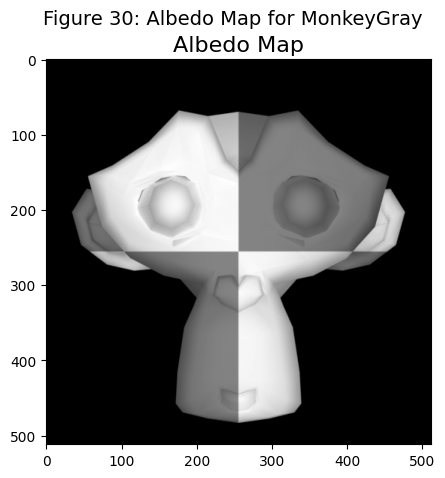

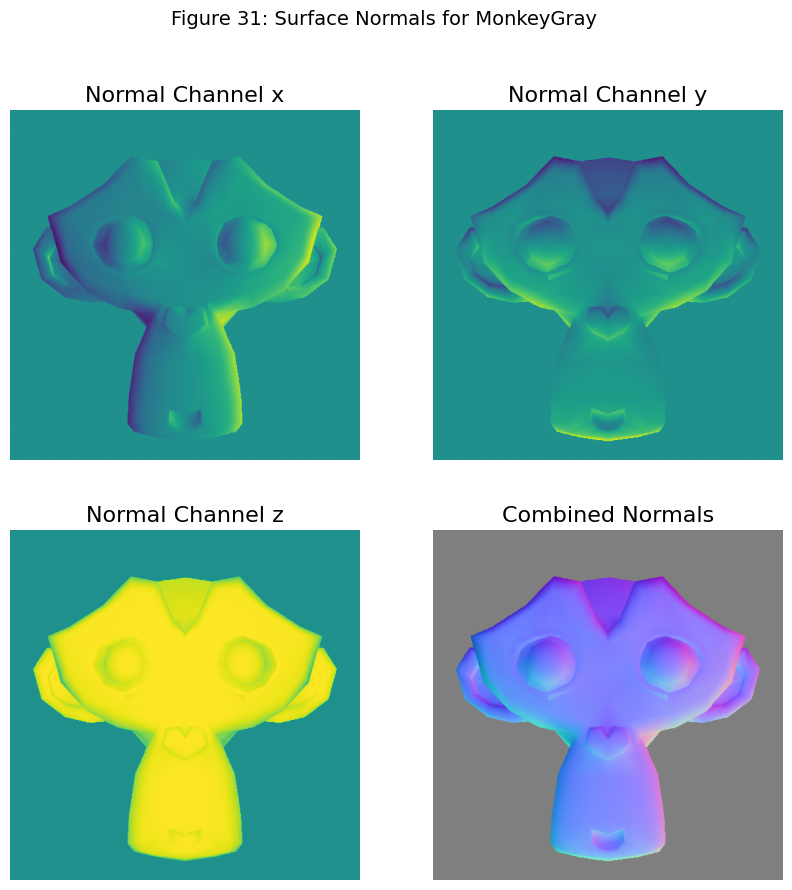

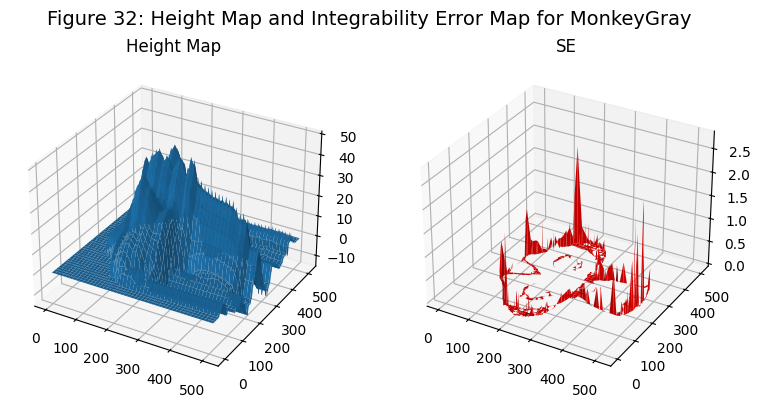

In [33]:
# Use the function
image_dir = './photometrics_images/MonkeyGray/'

titles = {
    "albedo": "Figure 30: Albedo Map for MonkeyGray",
    "normal": "Figure 31: Surface Normals for MonkeyGray",
    "HSE": "Figure 32: Height Map and Integrability Error Map for MonkeyGray"
}
photometric_stereo(titles, image_dir)

Figure 30 shows the albedo on the MonkeyGrey dataset, showing intrinsic surface properties, as seen with the checkboard pattern.

Figure 31 shows the surface normals for the MonkeyGray dataset, showed as separate x/y/z channels and a combined visualization.

Figure 32 shows the height map and integrability error for the MonkeGray dataset, with errors mostly around the edges of the monkey.

<a id="question-26"></a>
#### <font color='#FF0000'>Question 26 (2 points)</font>

The albedo results for the MonkeyGray model may exhibit more errors (SE) compared to the sphere. Observe and describe the errors (SE) that arise when running the photometric stereo algorithm on the MonkeyGray model.

What could be the reasons for these errors? Experiment with different numbers of images, as you did in Question 15 and Question 18, to see the effects and discuss your observations.

##### <font color='yellow'>Answer:</font>

>On MonkeyGray, SE concentrates along the silhouette and around high-curvature concavities (eyes, mouth, ears), with additional spikes where $n_z$ is small (this can be seen in Figure 32). Compared to the sphere, MonkeyGray violates Lambertian assumptions more often due to self-shadowing and interreflections; minor exposure/normalization inconsistencies are visible in albedo and contribute to non-integrable gradients. Using all lights reduces mean SE versus 20 lights, but adding many grazing-angle lights increases shadow/specular outliers unless robust weighting/masking is used. Averaging row/column integration mitigates striping, but integrability-enforcing integration would further reduce drift.

<a id="question-27"></a>
#### <font color='#FF0000'>Question 27 (2 points)</font>

Considering the errors observed in the albedo results for the MonkeyGray model, what do you think could help in reducing or solving these errors? Provide your thoughts on potential strategies or methods that might improve the accuracy of the results.

##### <font color='yellow'>Answer:</font>

>To reduce the MonkeyGray errors, one could use better light calibration and exposure normalization, apply robust regression or outlier rejection to handle shadows/speculars, smooth normals before computing gradients, and enforce integrability to stabilize the height map.

<a id="question-28"></a>
#### <font color='#FF0000'>Question 28 (5 points)</font>

So far, we have assumed that albedos and input images are 1-channel grayscale images. To work with 3-channel RGB images, a simple approach is to split the input image into separate channels and treat them individually. However, this method may introduce issues when constructing the surface normal map if a pixel value in a channel is zero.

Update the implementation to work with 3-channel RGB inputs. Complete the functions `load_synthetic_images_rgb` and `estimate_albedo_and_normals_rgb ` to handle RGB images, and test your updated implementation with the SphereColor and MonkeyColor models using the `photometric_stereo_rgb` function. Make sure to display the results.

In [34]:
def load_synthetic_images_rgb(image_dir):
    """
    Loads synthetic RGB images and light directions.

    This function reads images from the specified directory, processes each color channel separately, 
    and stacks them together along with their corresponding light directions.

    Args:
        image_dir: Path to the directory containing the images.

    Returns:
        A tuple containing the image stack and the light directions.
    """
    import re
    files = sorted([f for f in os.listdir(image_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
    assert len(files) > 0, "No RGB images found in the directory."
    sample = cv2.imread(os.path.join(image_dir, files[0]), -1)
    h, w = sample.shape[:2]
    n = len(files)
    image_stack_rgb = np.zeros((h, w, n, 3), dtype=np.float64)
    light_directions = []
    for j, fname in enumerate(files):
        img = cv2.imread(os.path.join(image_dir, fname), -1)
        if img.ndim == 2:
            img = np.stack([img, img, img], axis=-1)
        image_stack_rgb[:, :, j, :] = img[:, :, :3].astype(np.float64)
        m = re.findall(r'[-+]?\d+\.?\d*', os.path.splitext(fname)[0])
        if len(m) >= 3:
            x_component, y_component, z_component = float(m[-3]), float(m[-2]), float(m[-1])
        else:
            theta = 2 * np.pi * (j / max(1, n))
            phi = np.pi/4
            x_component = np.cos(phi) * np.cos(theta)
            y_component = -np.cos(phi) * np.sin(theta)
            z_component = np.sin(phi)
        light_directions.append([x_component, -y_component, z_component])
    light_directions = np.array(light_directions, dtype=np.float64)
    min_val = np.min(image_stack_rgb)
    max_val = np.max(image_stack_rgb)
    if max_val != min_val:
        image_stack_rgb = (image_stack_rgb - min_val) / (max_val - min_val)
    else:
        image_stack_rgb[:] = 0.0
    norms = np.linalg.norm(light_directions, axis=1, keepdims=True)
    scriptV_rgb = light_directions / np.maximum(norms, 1e-12)
    
    return image_stack_rgb, scriptV_rgb

In [35]:
def estimate_albedo_and_normals_rgb(image_stack, scriptV, shadow_trick=True):
    """
    Estimates albedo and normals from a stack of RGB images and light directions.

    This function processes each color channel separately to estimate the albedo and normal maps.
    The results from each channel are then combined to produce the final albedo and normal maps.

    Args:
        image_stack: Image stacks for each color channel.
        scriptV: Light directions for each color channel.
        shadow_trick: Whether or not to use the shadow trick. Defaults to True.

    Returns:
        A tuple containing the albedo and normal maps.
    """

    h, w, n, c = image_stack.shape
    assert c == 3, "Expected 3 channels"
    g_list = []
    for ch in range(3):
        alb_c, nrm_c = estimate_albedo_and_normals(image_stack[:, :, :, ch], scriptV, shadow_trick=shadow_trick)
        g_c = np.zeros_like(nrm_c)
        g_c[:, :, 0] = alb_c * nrm_c[:, :, 0]
        g_c[:, :, 1] = alb_c * nrm_c[:, :, 1]
        g_c[:, :, 2] = alb_c * nrm_c[:, :, 2]
        g_list.append(g_c)
    g_stack = np.stack(g_list, axis=-1)  # (h,w,3,3ch)
    alb_stack = np.stack([np.linalg.norm(g, axis=2) for g in g_list], axis=-1)
    valid = alb_stack > 1e-8
    weights = valid.astype(np.float64)
    ws = np.sum(weights, axis=-1, keepdims=True)
    ws = np.maximum(ws, 1.0)
    g_combined = np.sum(g_stack * weights[..., None], axis=-1) / ws
    albedo = np.linalg.norm(g_combined, axis=2)
    normals = np.zeros_like(g_combined)
    nz = albedo > 1e-8
    normals[nz] = (g_combined[nz].T / albedo[nz]).T
    
    return albedo, normals

In [36]:
def photometric_stereo_rgb(titles, image_dir='./SphereColor/'):
    """
    Performs photometric stereo on RGB images to estimate the surface albedo, normals, and height map.

    This function loads RGB images from the specified directory, computes the surface albedo and 
    normal maps, checks integrability, reconstructs the surface height map, and displays the results.

    Args:
        image_dir: Path to the directory containing the images.
    """

    image_stack_rgb, scriptV = load_synthetic_images_rgb(image_dir)
    albedo, normals = estimate_albedo_and_normals_rgb(image_stack_rgb, scriptV, shadow_trick=True)
    p, q, SE = check_integrability(normals)
    finite = np.isfinite(SE)
    threshold = np.percentile(SE[finite], 95.0) if np.any(finite) else 0.0
    SE_vis = SE.copy()
    SE_vis[SE_vis <= threshold] = float('nan')
    height_map = construct_surface(p, q, path_type='average')
    show_results(albedo, normals, titles, height_map, SE_vis)

If you estimate the albedo and surface normal for SphereColor and MonkeyColor, the cell below will run for atleast 1 or 2 minutes.

Albedo shape: (512, 512)


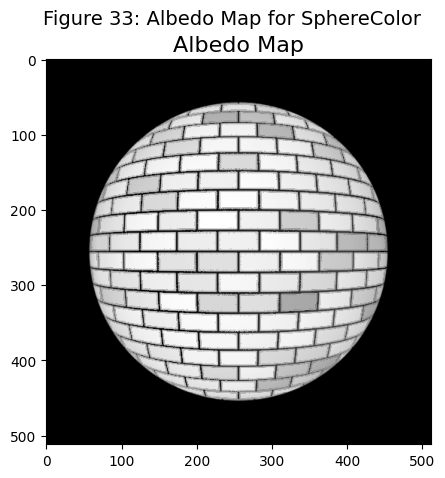

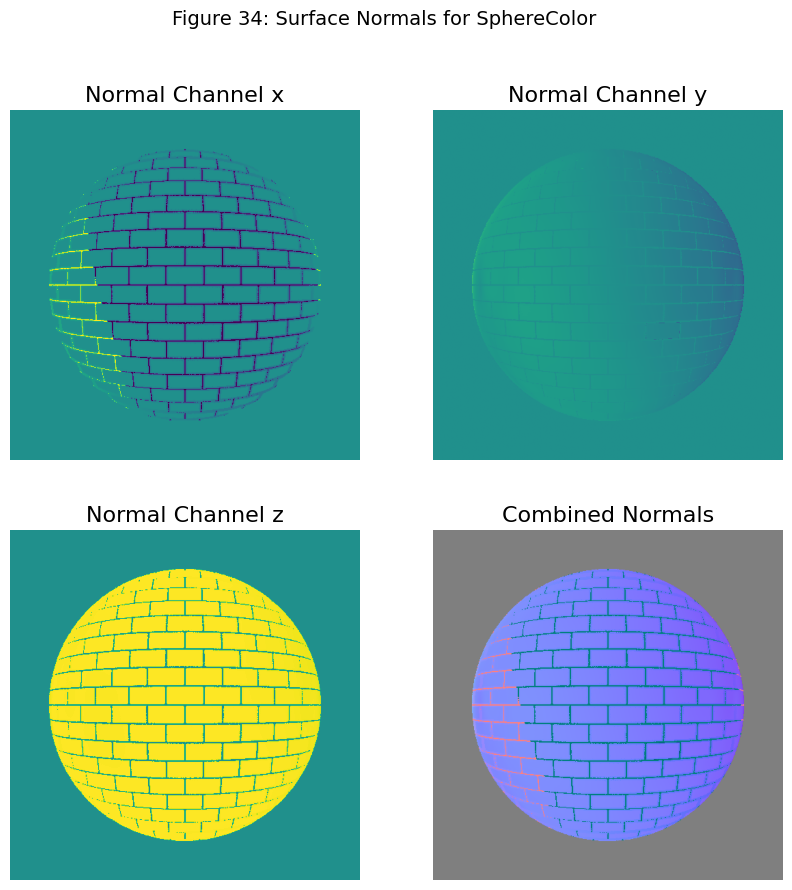

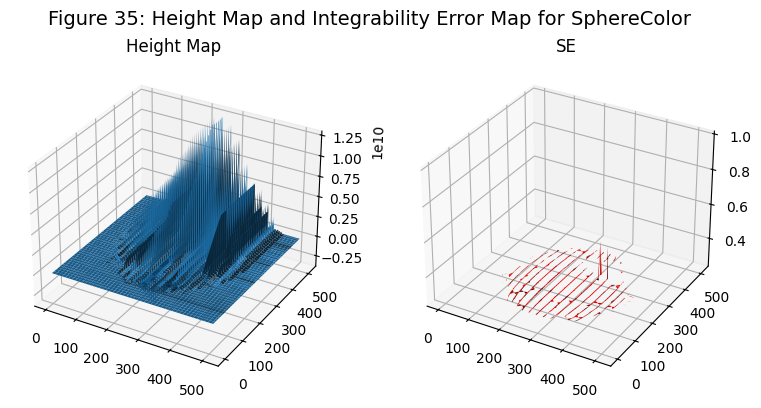

Albedo shape: (512, 512)


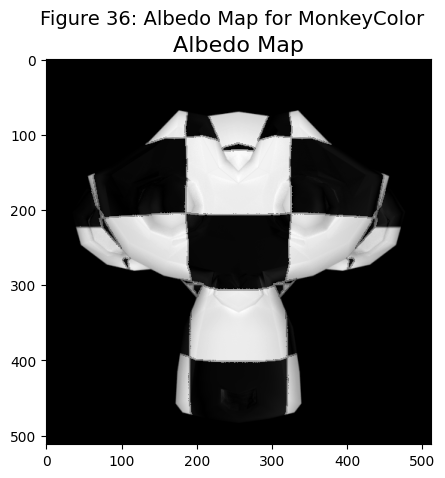

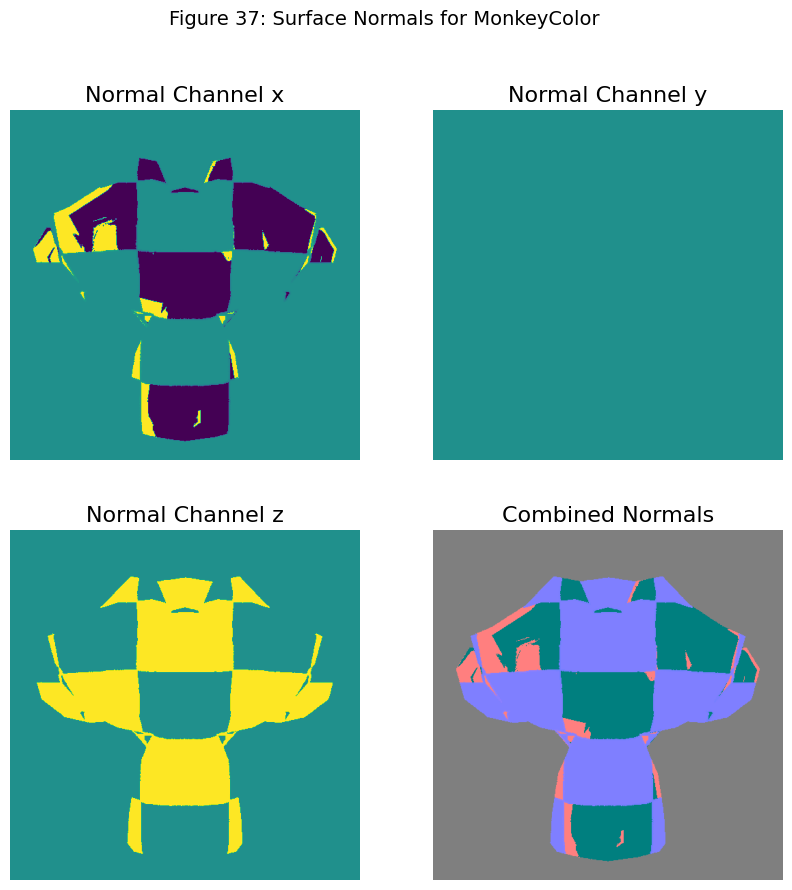

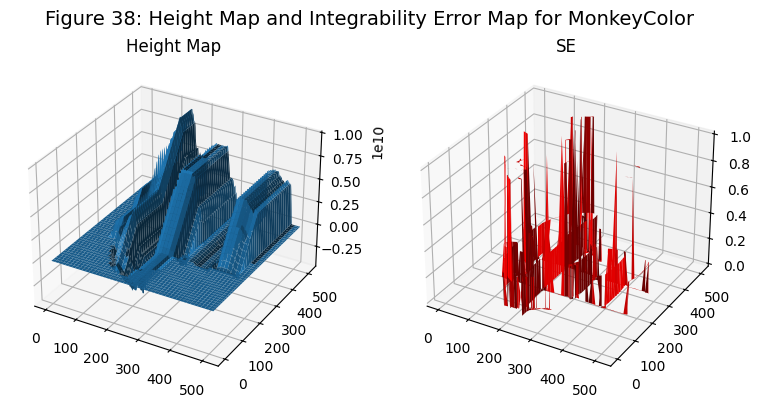

In [37]:
# SphereColor
titles = {
    "albedo": "Figure 33: Albedo Map for SphereColor",
    "normal": "Figure 34: Surface Normals for SphereColor",
    "HSE": "Figure 35: Height Map and Integrability Error Map for SphereColor"
}
photometric_stereo_rgb(titles, './photometrics_images/SphereColor')
# MonkeyColor
titles = {
    "albedo": "Figure 36: Albedo Map for MonkeyColor",
    "normal": "Figure 37: Surface Normals for MonkeyColor",
    "HSE": "Figure 38: Height Map and Integrability Error Map for MonkeyColor"
}
photometric_stereo_rgb(titles, './photometrics_images/MonkeyColor/')

Figure 33 shows the albedo for the SphereColor dataset.

Figure 34 shows the surface normals for the SphereColor dataset using average-major integration, showed as separate x/y/z channels and a combined visualization.

Figure 35 shows the height map and integrability error for the SphereColor dataset using average-major integration, with errors mostly around the bricks of the sphere.

Figure 36 shows the albedo for the MonkeyColor dataset.

Figure 37 shows the surface normals for the MonkeyColor dataset using average-major integration, showed as separate x/y/z channels and a combined visualization.

Figure 38 shows the height map and integrability error for the MonkeyColor dataset using average-major integration, with errors mostly around areas with edges in the image.

<a id="question-29"></a>
#### <font color='#FF0000'>Question 29 (2 points)</font>

Explain the changes made to the function and discuss the results of these changes.

##### <font color='yellow'>Answer:</font>

>When we switched from grayscale to RGB, we separated the channels, solved photometric stereo for each one, and combined the results using a validity-weighted average to prevent failures in any single channel. On SphereColor, this approach gives stable normals and low SE (Figures 34 and 35). However, on MonkeyColor, the complex shapes, shadows, and strong albedo contrasts still increase SE (see Figures 36 and 38) and sometimes cause blocky or blank channels, as seen in Figure 37. By using a shared normal across colors, applying stronger weighting, integrating with awareness of consistency, and improving intensity calibration, we can reduce these issues.

<a id="question-30"></a>
#### <font color='#FF0000'>Question 30 (2 points)</font>

Observe the problem in the constructed surface normal map and height map. Explain why a zero pixel could be a problem and propose a way to overcome that.

##### <font color='yellow'>Answer:</font>

>If all the intensity vectors are close to zero than the least square problem has no meaningful solution, because the normal would be g divided by almost 0. This will lead to flat colored patches, the height map wil show a figure that is similar to a stair. To solve this we could mask those pixels below a threshold or we could interpolate from the neighbors.

<a id="question-31"></a>
#### <font color='#FF0000'>Question 31 (4 points)</font>

Now, it's time to apply the algorithm to real-world datasets. We will first use the Yale Face Database.

For the Face dataset, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface height
- Show the results

Run the algorithm for the Yale Face images: [Yale Face Database](http://cvc.cs.yale.edu/cvc/projects/yalefaces/yalefaces.html). The Yale face data is included in the lab material. The `load_face_images` function is provided as a helper. You should complete the `photometric_stereo_face_dataset` function as part of this task.

Make sure to display the results for the Face dataset using the 3 paths (column-major, row-major, and average) when constructing the surface height map.

**Hint**: For proper computation of albedo and surface normal, you may want to suspend the shadow trick described in the text, and use the original formula:
$$i = Vg(x,y)$$

In [38]:
def load_face_images(image_dir='./photometrics_images/yaleB02/'):
    """
    Loads a set of face images from the Yale Face Database and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Yale Face images. Defaults to './photometrics_images/yaleB02/'.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with the ambient image subtracted and normalized.
            - scriptV: An array of light direction vectors corresponding to each image.
    """
    
    # define the number of images to load
    num_images = 64
    
    # load the ambient image (the image without any lighting)
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)
    
    # get the height and width of the ambient image
    h, w = ambient_image.shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the yaleB02 face dataset
    d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
    
    # randomly select a subset of images to match the num_images count
    import random
    d = random.sample(d, num_images)
    
    # extract the base filenames from the list of image paths
    filenames = [os.path.basename(x) for x in d]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # extract the lighting angles from the filename
        ang[0,j], ang[1,j] = np.double(filenames[j][12:16]), np.double(filenames[j][17:20])
        
        # load the image and subtract the ambient image to get the actual illumination effect
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1) - ambient_image

    # calculate the light direction vectors based on the extracted angles
    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    
    # combine the direction vectors, adjusting for normal direction
    scriptV = [-1,-1,1] * np.array([y,z,x]).transpose(1,0)

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack<0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions
    return image_stack, scriptV

In [39]:
def photometric_stereo_face_dataset(titles, image_dir='./images/photometrics_images/yaleB02/', path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Yale Face Dataset under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './images/photometrics_images/yaleB02/').
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    image_stack, scriptV = load_face_images(image_dir)
    h, w, n = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')

    # YOUR CODE HERE

    albedo, normal = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=False)


    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')
    p, q, SE = check_integrability(normal)


    # YOUR CODE HERE

    # YOUR CODE HERE
    threshold = np.mean(SE) + 2 * np.std(SE)

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')

    # YOUR CODE HERE
    height_map = construct_surface(p, q, path_type)   

    # show results
    print('Displaying results...\n')
    show_results(albedo, normal, titles, height_map, SE)

    # YOUR CODE HERE
    return None


If you estimate the albedo and surface normal using the three path types, the cell below will run for at least 10 seconds.

Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 6

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


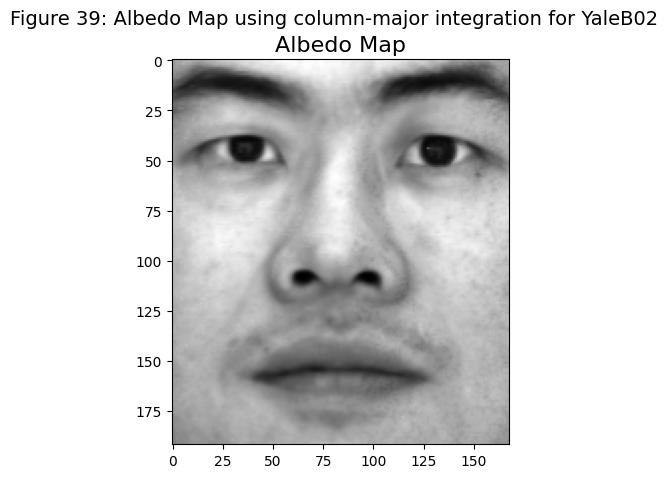

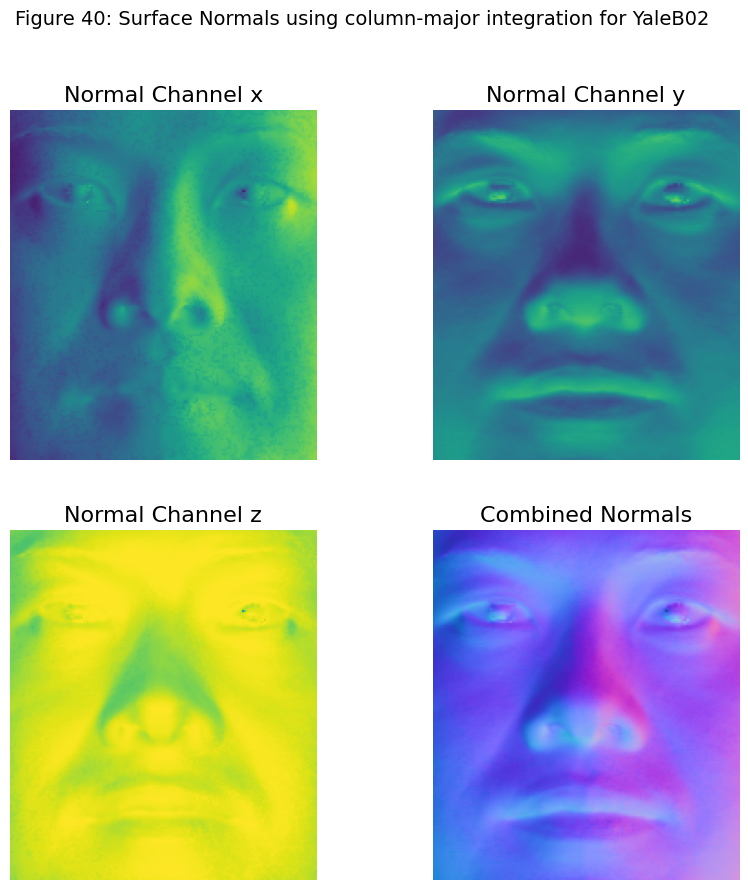

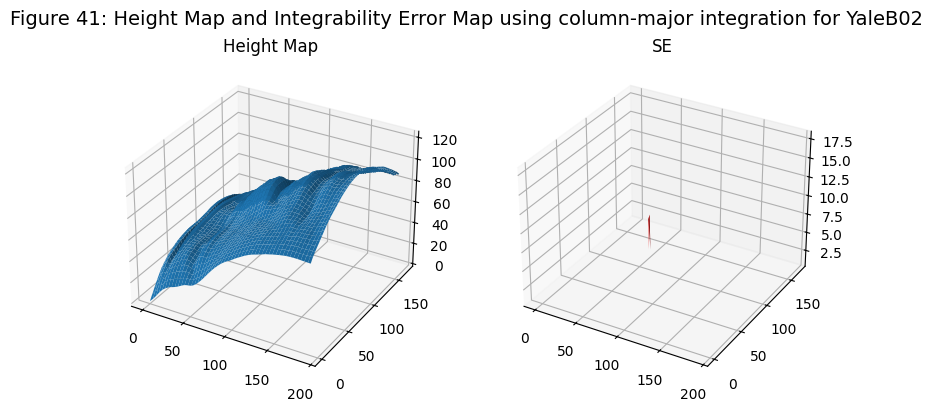

Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 6

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


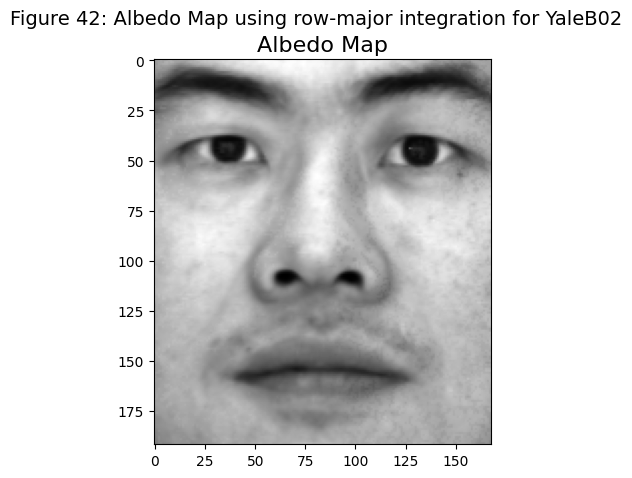

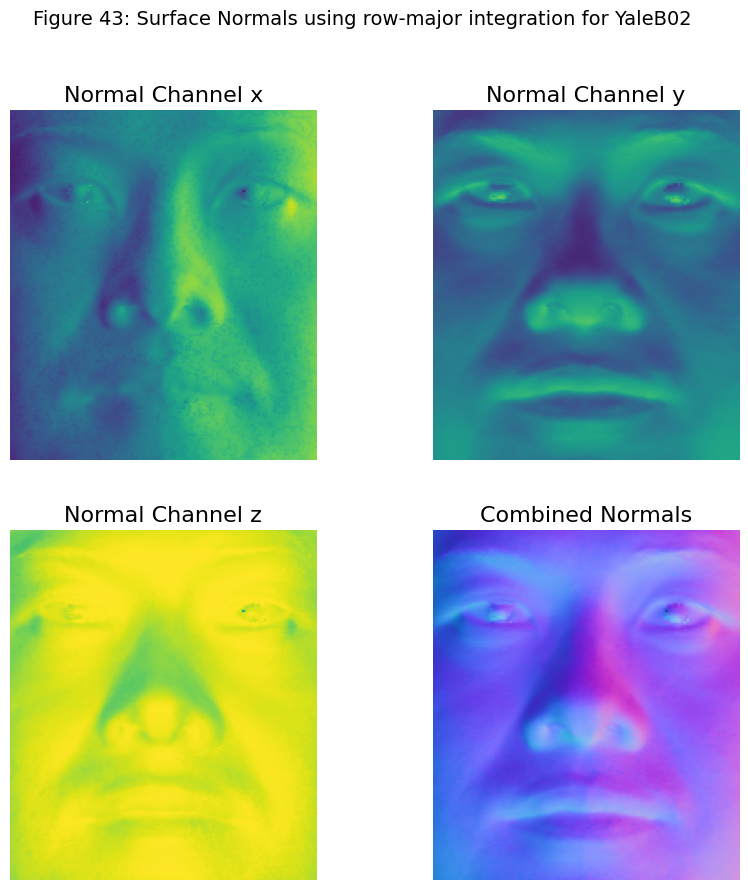

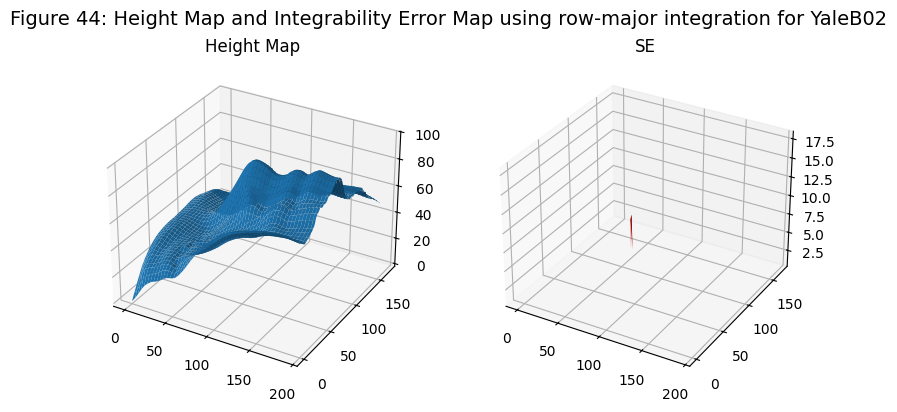

Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 6

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


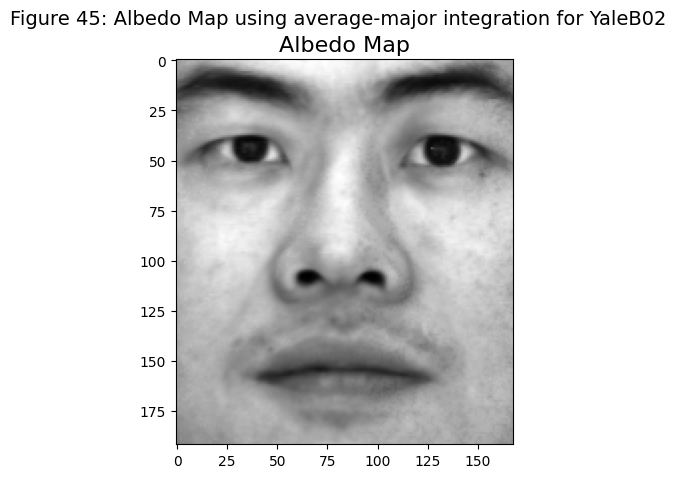

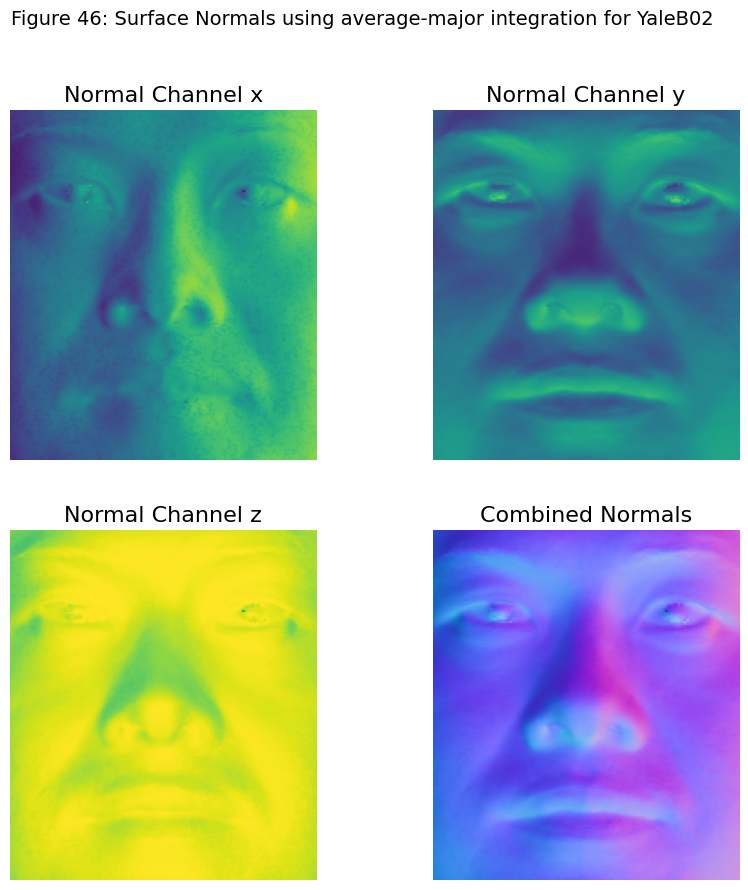

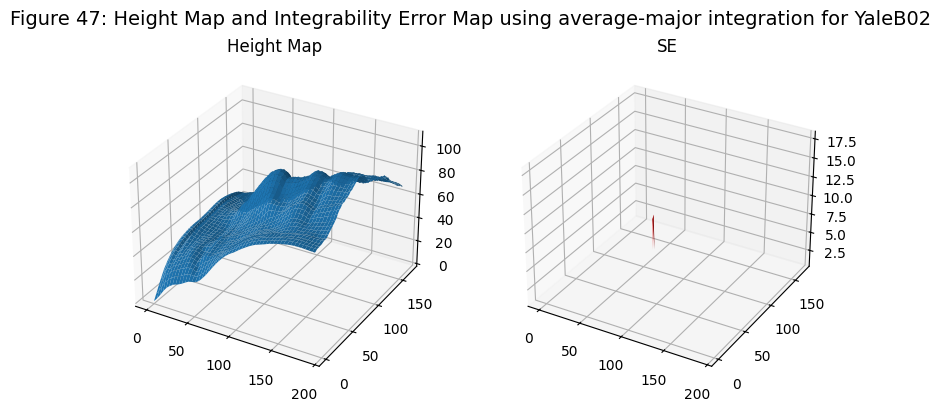

In [40]:
# YOUR CODE HERE
titles = {
    "albedo": "Figure 39: Albedo Map using column-major integration for YaleB02",
    "normal": "Figure 40: Surface Normals using column-major integration for YaleB02",
    "HSE": "Figure 41: Height Map and Integrability Error Map using column-major integration for YaleB02"
}
photometric_stereo_face_dataset(titles, './photometrics_images/yaleB02/', 'column')

titles = {
    "albedo": "Figure 42: Albedo Map using row-major integration for YaleB02",
    "normal": "Figure 43: Surface Normals using row-major integration for YaleB02",
    "HSE": "Figure 44: Height Map and Integrability Error Map using row-major integration for YaleB02"
}
photometric_stereo_face_dataset(titles, './photometrics_images/yaleB02/', 'row')

titles = {
    "albedo": "Figure 45: Albedo Map using average-major integration for YaleB02",
    "normal": "Figure 46: Surface Normals using average-major integration for YaleB02",
    "HSE": "Figure 47: Height Map and Integrability Error Map using average-major integration for YaleB02"
}
photometric_stereo_face_dataset(titles, './photometrics_images/yaleB02/', 'average')



Figure 39 shows the albedo for the YaleB02 dataset using column-major integration.

Figure 40 shows the surface normals for the YaleB02 dataset using column-major integration, showed as separate x/y/z channels and a combined visualization.

Figure 41 shows the height map and integrability error for the YaleB02 dataset using column-major integration. The height map shows a face structure and the SE is very low.

Figure 42 shows the albedo for the YaleB02 dataset using row-major integration.

Figure 43 shows the surface normals for the YaleB02 dataset using row-major integration, showed as separate x/y/z channels and a combined visualization.

Figure 44 shows the height map and integrability error for the YaleB02 dataset using row-major integration. The height map shows a face structure and the SE is very low.

Figure 45 shows the albedo for the YaleB02 dataset using average-major integration.

Figure 46 shows the surface normals for the YaleB02 dataset using average-major integration, showed as separate x/y/z channels and a combined visualization.

Figure 47 shows the height map and integrability error for the YaleB02 dataset using average-major integration. The height map shows a face structure and the SE is very low.

<a id="question-32"></a>
#### <font color='#FF0000'>Question 32 (1 point)</font>

Observe and discuss the results for different integration paths in the `photometric_stereo_face_dataset` function.

##### <font color='yellow'>Answer:</font>

>With the column path, the height map (see Figure 41) emphasizes vertical features, so the structures are more appearent around the eyes (as shown in Figures 39 and 40). The rows path height map (Figure 44) makes the nose more defined, the grooves from the eyes towards the mouth are clearer. The average path height map (Figure 47) shows the combination so defined eyes, nose and mouth as seen in Figure 47

<a id="question-33"></a>
#### <font color='#FF0000'>Question 33 (2 points)</font>

Discuss how the images violate the assumptions of the shape-from-shading methods. Include specific input images to illustrate your points.

##### <font color='yellow'>Answer:</font>

>- it violates that surfaces reflect light equally in all directions, around the nosetip its brighter than around the mouth, for example yaleB02_P00A+000E-35.pgm
>- there isnt a constant albedo, because the material changes, hair for the eyebrow isnt the same material as skin.
>- the lightsource isnt at infinity, and the lightsource isnt constant, because of the shadows on the face, for example yaleB02_P00A+085E+20.pgm
>- the camera also isnt at infinity, otherwise the whole face would appear on it, and it seems like it is taken from a lower perspective, for example yaleB02_P00A+020E-40

Source: Lecture HC2a Reflection - Photometric Stereo

<a id="question-34"></a>
#### <font color='#FF0000'>Question 34 (2 points)</font>

How would the results improve when the problematic images are removed? Try it out and show the results in your notebook.

To complete this task, you should implement the `load_face_images_filtered` and `photometric_stereo_face_filtered` functions.

In [41]:
def load_face_images_filtered(image_dir='./photometrics_images/yaleB02/', bad_images=[]):
    """
    Loads a set of face images from the Yale Face Database, excluding problematic ones, and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Yale Face images. Defaults to './photometrics_images/yaleB02/'.
        bad_images: A list of filenames to exclude from the image stack.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with the ambient image subtracted, normalized, and problematic images removed.
            - scriptV: An array of light direction vectors corresponding to each image.
    """

    # YOUR CODE HERE
    
    # define the number of images to load
    num_images = 64
    
    # load the ambient image (the image without any lighting)
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)
    
    # get the height and width of the ambient image
    h, w = ambient_image.shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the yaleB02 face dataset
    d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
    
    # extract the base filenames from the list of image paths
    all = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
    filenames = [os.path.basename(x) for x in d if os.path.basename(x) not in bad_images]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, len(filenames)])
    image_stack = np.zeros([h, w, len(filenames)])

    # loop through each selected image file
    for j, fname in enumerate(filenames):
        # extract the lighting angles from the filename
        ang[0,j] = float(fname[12:16])
        ang[1,j] = float(fname[17:20])
        img = cv2.imread(os.path.join(image_dir, fname), -1)
        image_stack[..., j] = img - ambient_image
        
    # calculate the light direction vectors based on the extracted angles
    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    
    # combine the direction vectors, adjusting for normal direction
    scriptV = np.array([y,z,x]).T * np.array([-1,-1,1])
    scriptV = scriptV / np.linalg.norm(scriptV, axis=1, keepdims=True)

    # convert the image stack to double precision
    image_stack = np.clip(image_stack, 0, None)
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    return image_stack, scriptV

In [42]:
def photometric_stereo_face_filtered(titles, bad_images=[], image_dir='./photometrics_images/yaleB02/', shadow_trick=False, path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Yale Face Dataset, excluding problematic images.

    Args:
        bad_images: A list of filenames to exclude from the image stack (default is an empty list).
        image_dir: Directory containing the input images (default is './photometrics_images/yaleB02/').
        shadow_trick: Whether or not to use the shadow trick for albedo and normal estimation (default is False).
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # YOUR CODE HERE

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    image_stack, scriptV = load_face_images_filtered(image_dir, bad_images)
    h, w, n = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # YOUR CODE HERE

    albedo, normal = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=False)


    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')
    p, q, SE = check_integrability(normal)


    # YOUR CODE HERE

    # YOUR CODE HERE
    threshold = np.mean(SE) + 2 * np.std(SE)

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')

    # YOUR CODE HERE
    height_map = construct_surface(p, q, path_type)   

    # show results
    print('Displaying results...\n')
    show_results(albedo, normal, titles, height_map, SE)

    return None

Loading images...

Finish loading 47 images.

Integrability checking

Number of outliers: 94

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


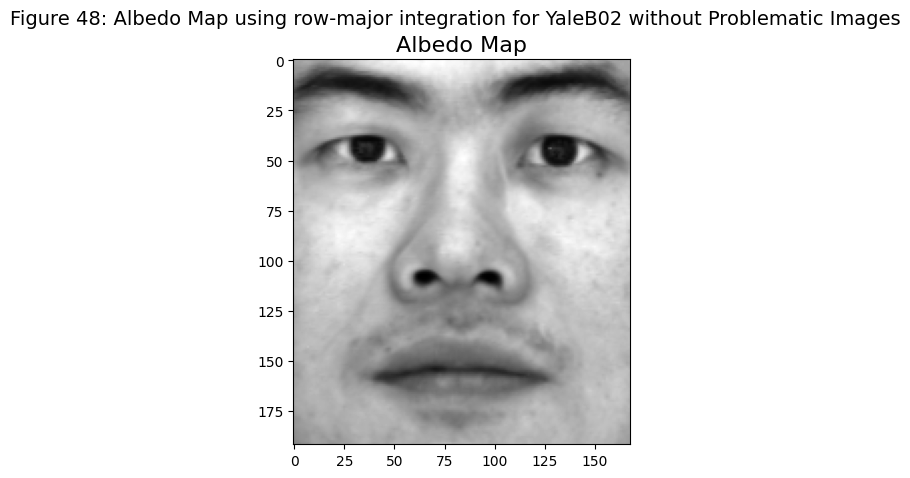

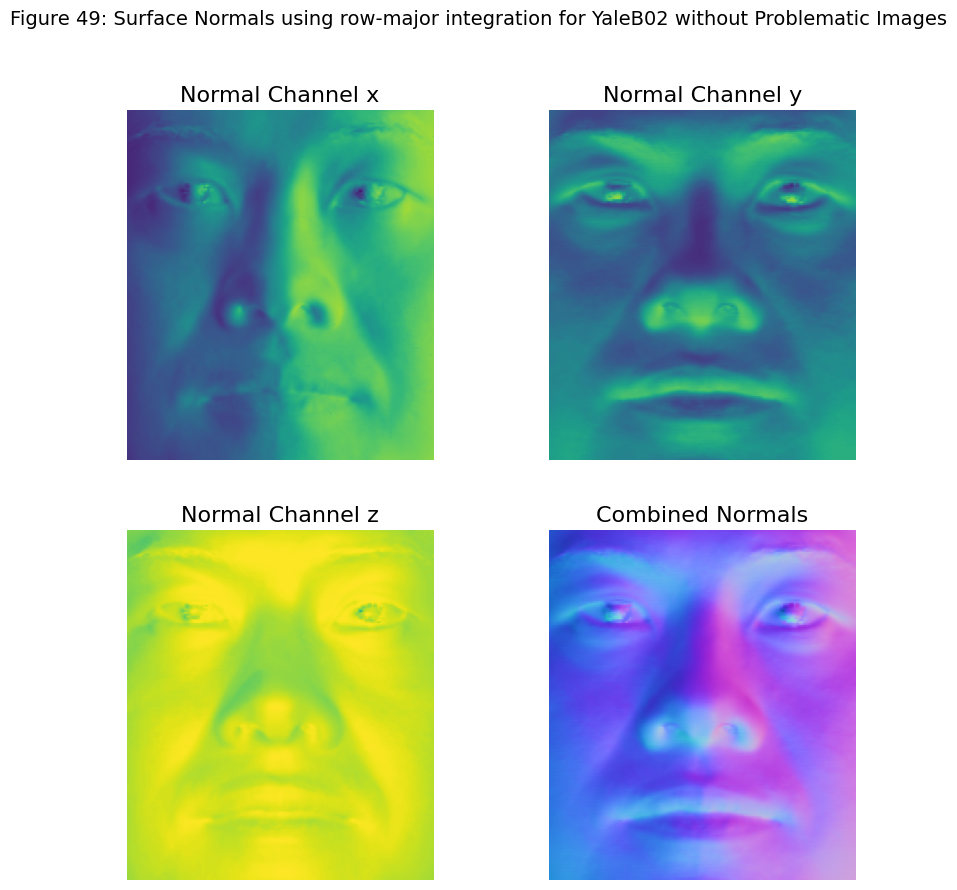

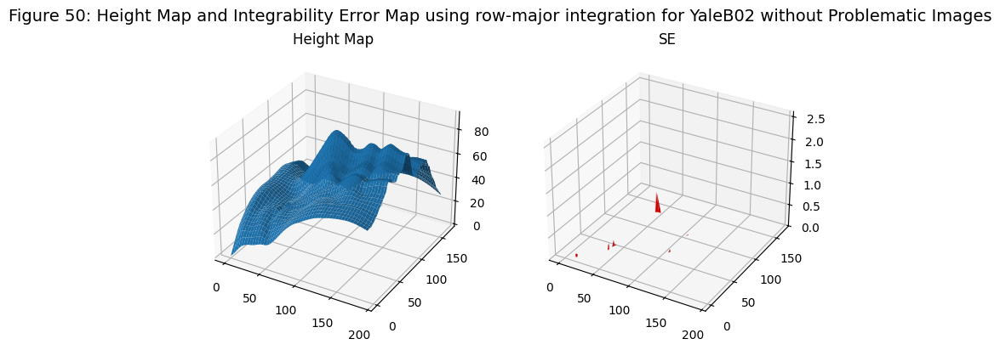

Loading images...

Finish loading 47 images.

Integrability checking

Number of outliers: 94

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


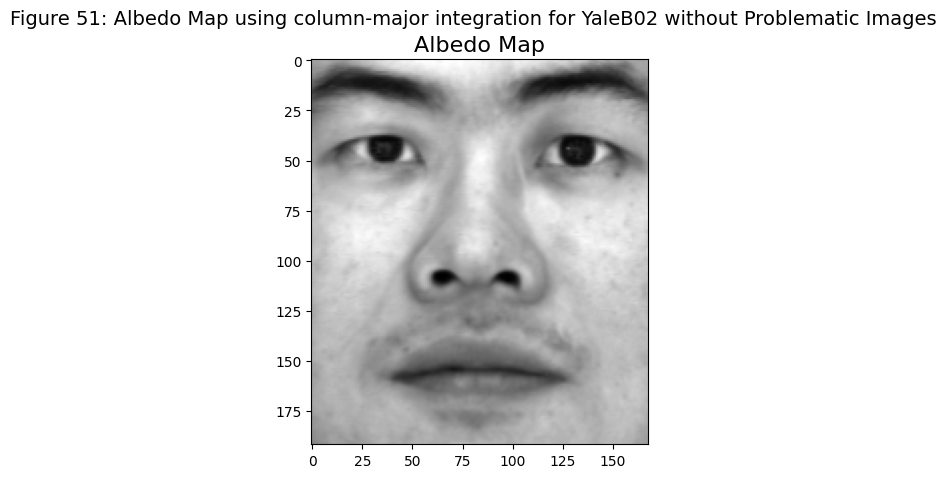

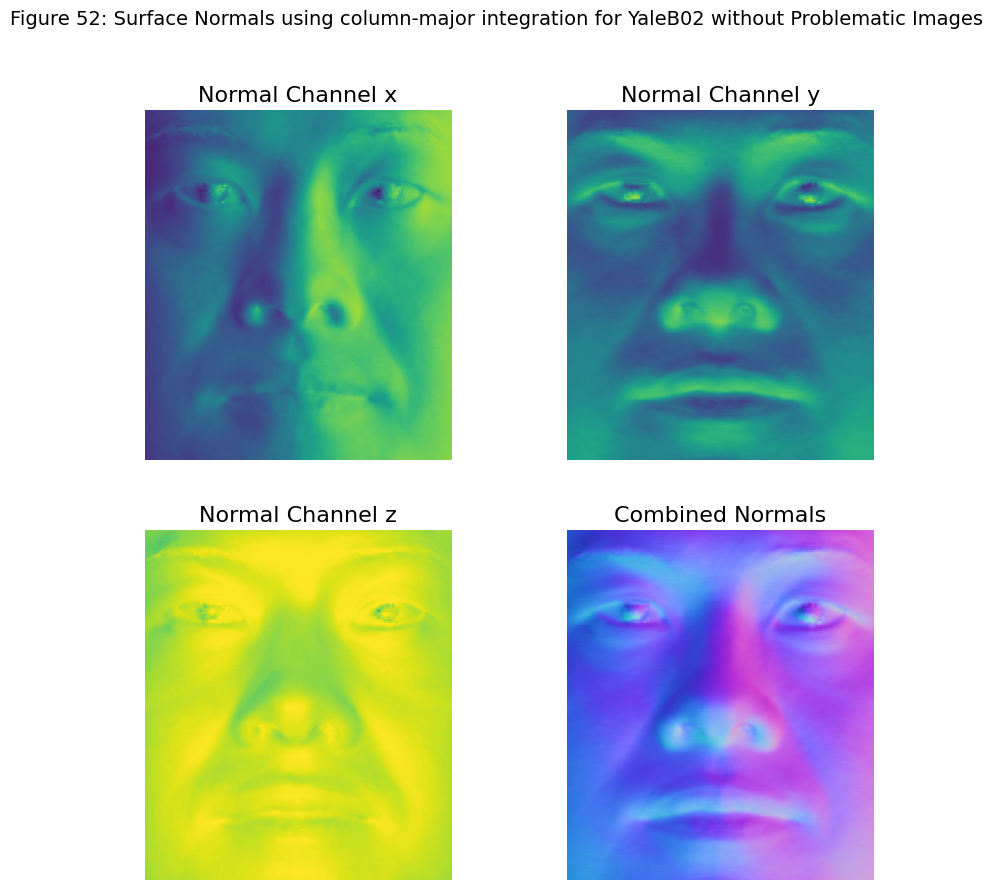

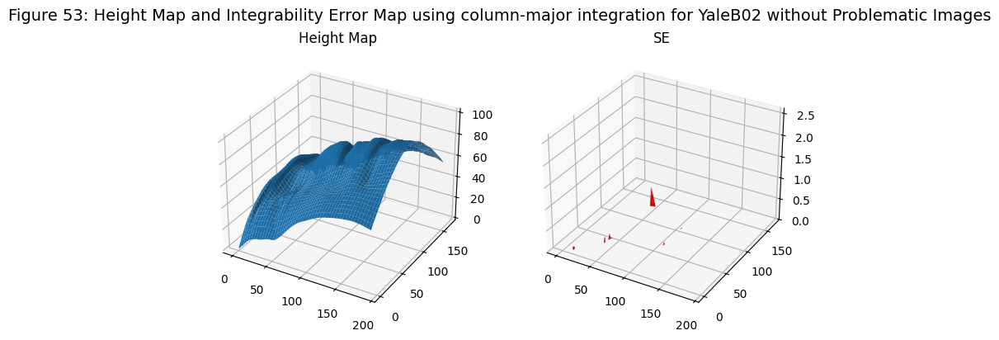

Loading images...

Finish loading 47 images.

Integrability checking

Number of outliers: 94

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


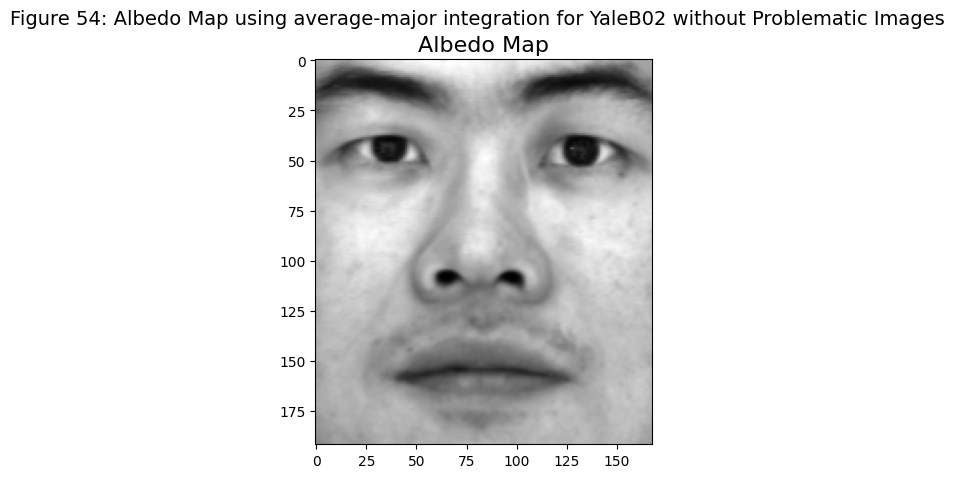

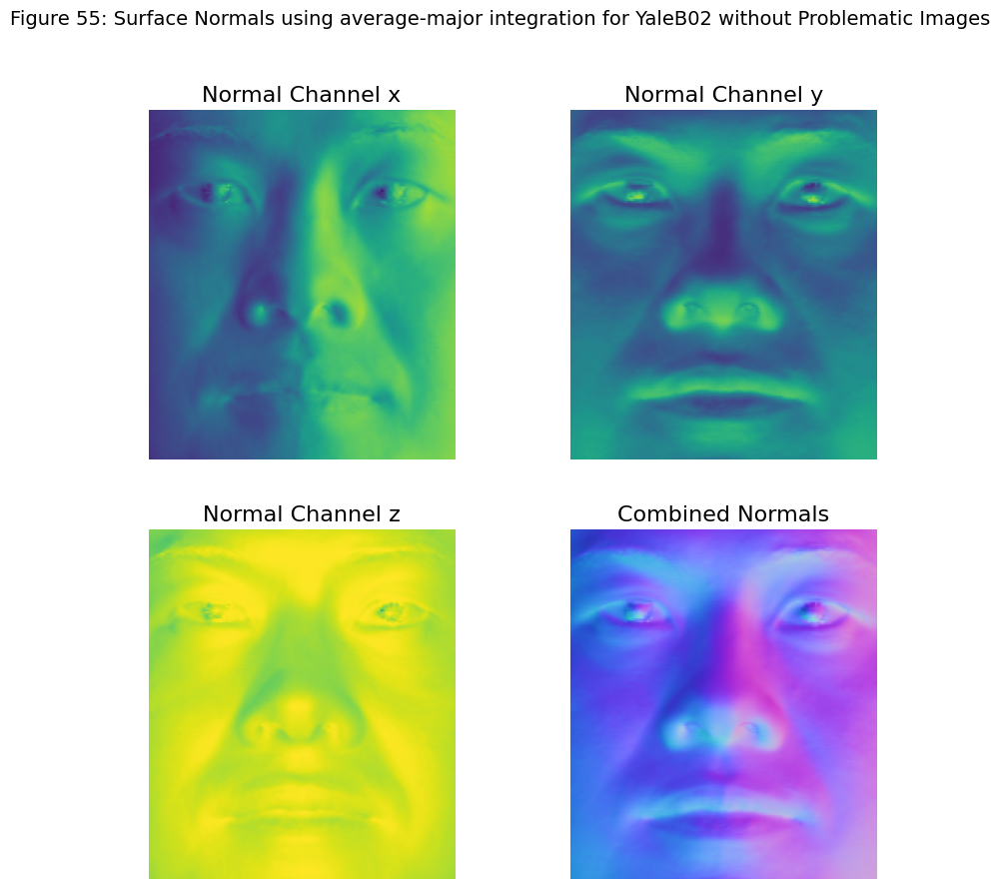

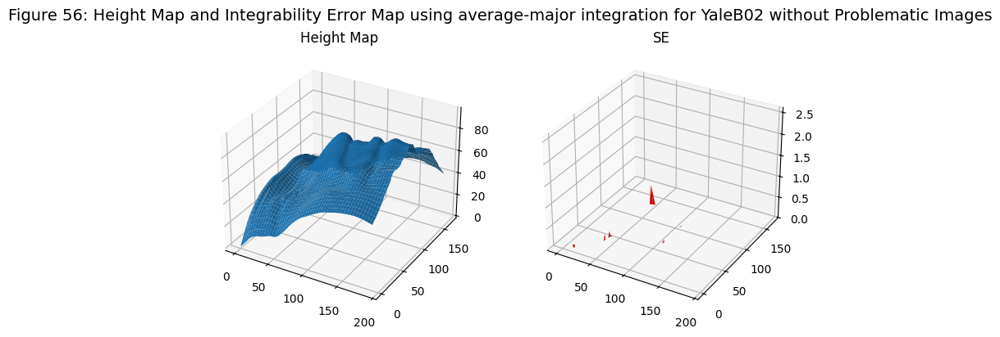

In [43]:
# YOUR CODE HERE
bad_images = ['yaleB02_P00A+000E+90.pgm', 
                'yaleB02_P00A+085E+20.pgm',
                'yaleB02_P00A+085E-20.pgm',
                'yaleB02_P00A+095E+00.pgm',
                'yaleB02_P00A+110E+15.pgm',
                'yaleB02_P00A+110E+40.pgm',
                'yaleB02_P00A+110E+65.pgm',
                'yaleB02_P00A+110E-20.pgm',
                'yaleB02_P00A+120E+00.pgm',
                'yaleB02_P00A+130E+65.pgm',
                'yaleB02_P00A-085E+20.pgm',
                'yaleB02_P00A-085E-20.pgm',
                'yaleB02_P00A-095E+00.pgm',
                'yaleB02_P00A-110E+15.pgm',
                'yaleB02_P00A-110E+40.pgm',
                'yaleB02_P00A-110E+65.pgm',
                'yaleB02_P00A-110E-20.pgm',
                'yaleB02_P00A-120E+00.pgm',
                'yaleB02_P00A-130E+65.pgm']

titles = {
    "albedo": "Figure 48: Albedo Map using row-major integration for YaleB02 without Problematic Images",
    "normal": "Figure 49: Surface Normals using row-major integration for YaleB02 without Problematic Images",
    "HSE": "Figure 50: Height Map and Integrability Error Map using row-major integration for YaleB02 without Problematic Images"
}
photometric_stereo_face_filtered(titles, bad_images=bad_images, path_type='row')

titles = {
    "albedo": "Figure 51: Albedo Map using column-major integration for YaleB02 without Problematic Images",
    "normal": "Figure 52: Surface Normals using column-major integration for YaleB02 without Problematic Images",
    "HSE": "Figure 53: Height Map and Integrability Error Map using column-major integration for YaleB02 without Problematic Images"
}
photometric_stereo_face_filtered(titles, bad_images=bad_images, path_type='column')

titles = {
    "albedo": "Figure 54: Albedo Map using average-major integration for YaleB02 without Problematic Images",
    "normal": "Figure 55: Surface Normals using average-major integration for YaleB02 without Problematic Images",
    "HSE": "Figure 56: Height Map and Integrability Error Map using average-major integration for YaleB02 without Problematic Images"
}
photometric_stereo_face_filtered(titles, bad_images=bad_images, path_type='average')

Figure 48 shows the albedo for the YaleB02 dataset using row-major integration without problematic images.

Figure 49 shows the surface normals for the YaleB02 dataset using row-major integration without problematic images, showed as separate x/y/z channels and a combined visualization.

Figure 50 shows the height map and integrability error for the YaleB02 dataset using row-major integration without problematic images. The height map shows a face shape and the SE is low.

Figure 51 shows the albedo for the YaleB02 dataset using column-major integration without problematic images.

Figure 52 shows the surface normals for the YaleB02 dataset using column-major integration without problematic images, showed as separate x/y/z channels and a combined visualization.

Figure 53 shows the height map and integrability error for the YaleB02 dataset using column-major integration without problematic images. The height map shows a face shape and the SE is low.

Figure 54 shows the albedo for the YaleB02 dataset using average-major integration without problematic images.

Figure 55 shows the surface normals for the YaleB02 dataset using average-major integration without problematic images, showed as separate x/y/z channels and a combined visualization.

Figure 56 shows the height map and integrability error for the YaleB02 dataset using average-major integration without problematic images. The height map shows a face shape and the SE is low.

<a id="question-35"></a>
#### <font color='#FF0000'>Question 35 (1 point)</font>

Discuss the results obtained after removing the problematic images. What are the differences in the results, and how do they compare to the original results?

##### <font color='yellow'>Answer:</font>

>As shown in Figure 53, the column heightmap becomes very flat. In contrast, it seems that the row path heightmap has 2 noses and 3 lips (figure 50), this happens because only the middle part is highlighted, while the sides are shadowed, creating a mountain like terrain. The heightmap of the average path (Figure 56) shows a more natural face. This average  (Figure 56) has a bit more depth than compared to the earlier average result (figure 47). Overall this filtered function is more defined, the grooves and surface variation are more visible, while in the unfiltered results are a bit more subdued.

<a id="question-36"></a>
#### <font color='#FF0000'>Question 36 (4 points)</font>

Now, it's time to apply the algorithm to the Apple dataset using real-world 3-channel RGB inputs.

For the Apple dataset, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface height
- Show the results

Use the images in the "Apple" folder. The `load_apple_images` function is provided as a helper. You should complete the `photometric_stereo_apple_dataset` function as part of this task.

Observe and discuss the results for different integration paths. You may encounter difficulties using this non-synthetic dataset—try if filtering may help.

Make sure to display the results using the 3 paths (column-major, row-major, and average) when constructing the surface height map.

In [44]:
def load_apple_images(image_dir='./photometrics_images/Apple'):
    """
    Loads a set of apple images from the Apple dataset and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Apple images. Defaults to './photometrics_images/Apple/'.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with only the red channel extracted and normalized.
            - scriptV: An array of light direction vectors corresponding to each image.
    """

    # define the number of images to load
    num_images = 99
    
    # load a sample image to determine its dimensions
    filename = os.path.join(image_dir, 'I_0000.png')
    try_image = cv2.imread(filename, -1)
    
    # get the height and width of the sample image
    h, w = try_image[:,:,0].shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the Apple dataset
    d = glob.glob(os.path.join(image_dir, 'I_00*.png'))
    
    # randomly select a subset of images to match the num_images count
    import random
    d = random.sample(d, num_images)
    
    # extract the base filenames from the list of image paths and their corresponding indices
    filenames = [os.path.basename(x) for x in d]
    filenames_idx = [int(i.split('_')[1].split('.')[0]) for i in filenames]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # load the image and extract the red channel (index 2)
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1)[:,:,2]

    # read light direction vectors from the provided file
    with open('./photometrics_images/Apple/light_directions_refined.txt') as file:
        lines = [line.split() for line in file]
        x, y, z = [], [], []
        
        # extract light directions corresponding to the selected images
        for idx in filenames_idx:
            x.append(float(lines[idx][0]))
            y.append(float(lines[idx][1]))
            z.append(float(lines[idx][2]))

    # combine the direction vectors, adjusting for normal direction
    scriptV = [1,-1,1] * np.array([x,y,z]).transpose(1,0)

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack < 0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions
    return image_stack, scriptV

In [45]:
def photometric_stereo_apple_dataset(titles, image_dir='./photometrics_images/Apple/', path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Apple Dataset under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './photometrics_images/Apple/').
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_apple_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')
    
    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=False)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')
    p, q, SE = check_integrability(normals)

    threshold = np.mean(SE) + 2 * np.std(SE)
    
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visibility

    # compute the surface height map
    print('Computing surface height map...\n')
    height_map = construct_surface(p, q, path_type)

    # show results
    print('Displaying results...\n')
    show_results(albedo, normals, titles, height_map, SE)

If you estimate the albedo and surface normal using the three path types, the cell below will run for at least 1 minute.

Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 3775

Computing surface height map...

Displaying results...

Albedo shape: (696, 646)


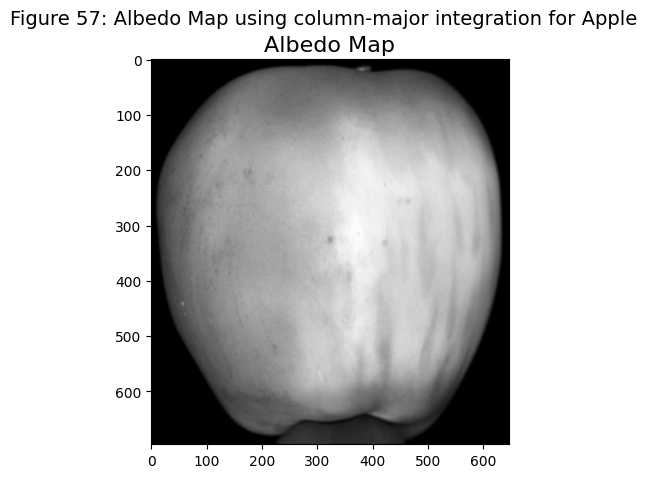

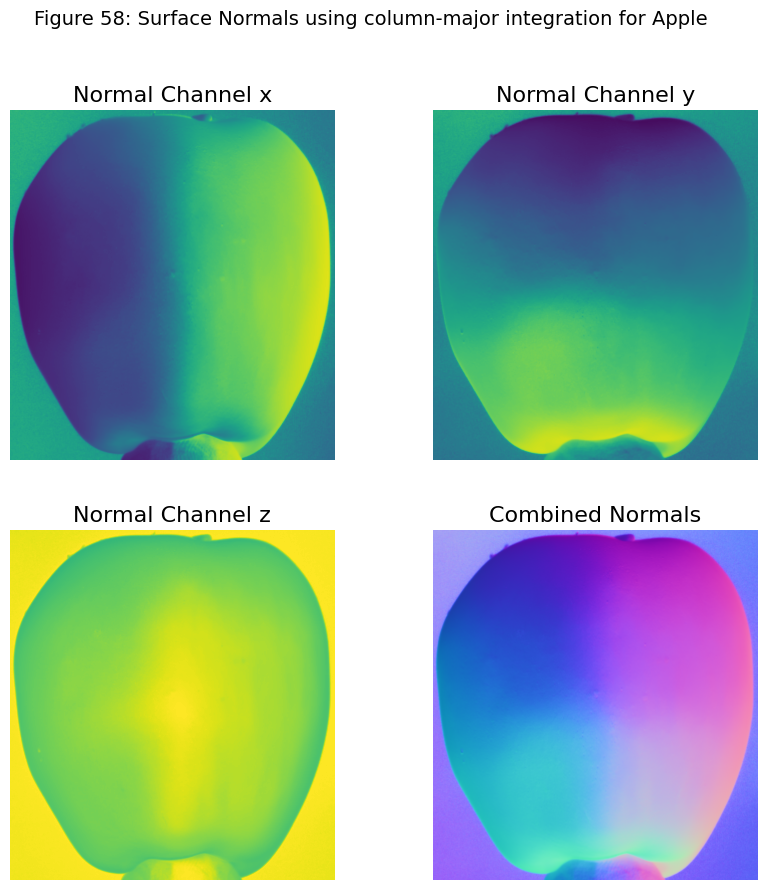

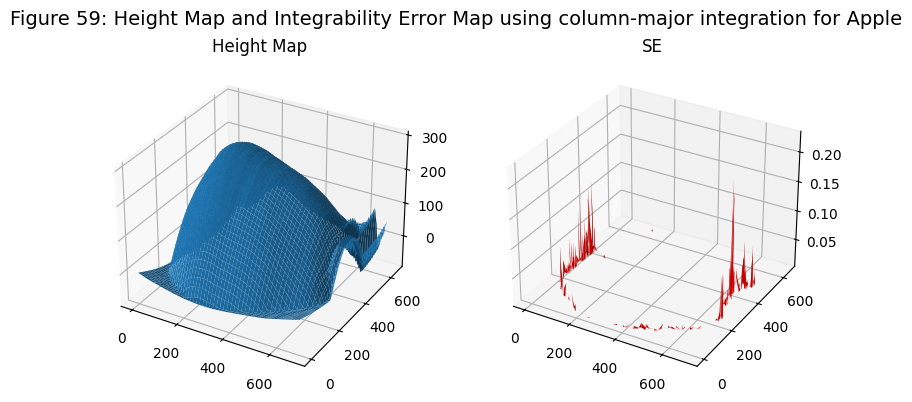

Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 3775

Computing surface height map...

Displaying results...

Albedo shape: (696, 646)


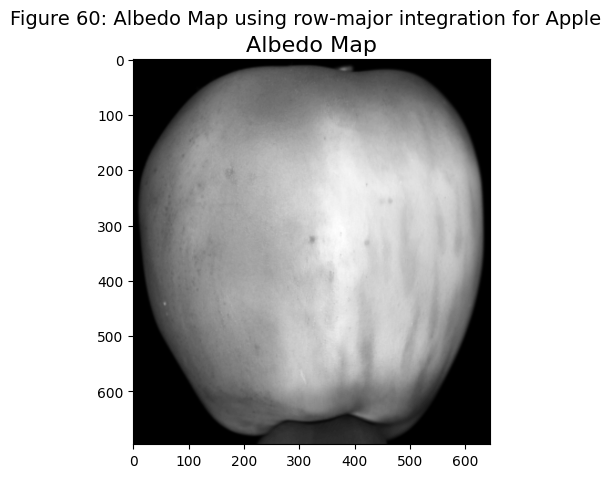

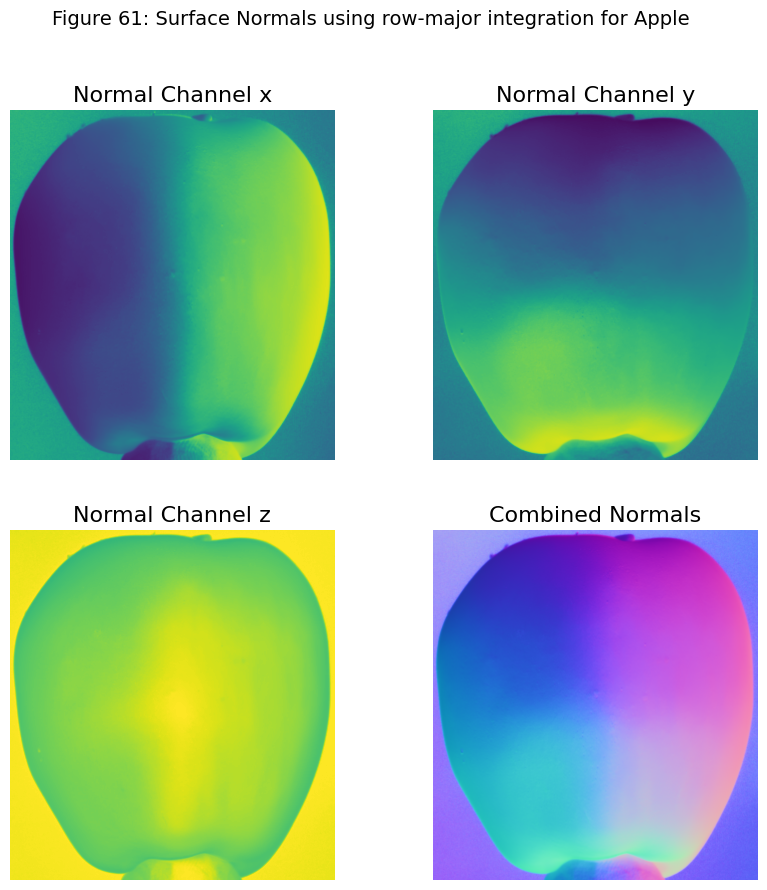

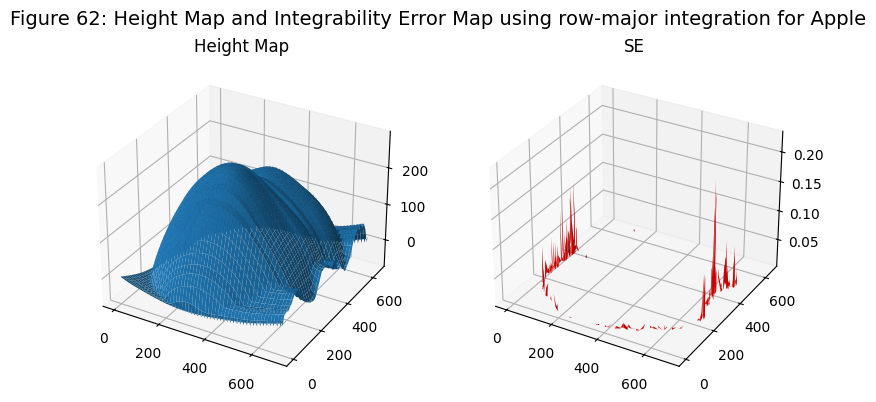

Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 3775

Computing surface height map...

Displaying results...

Albedo shape: (696, 646)


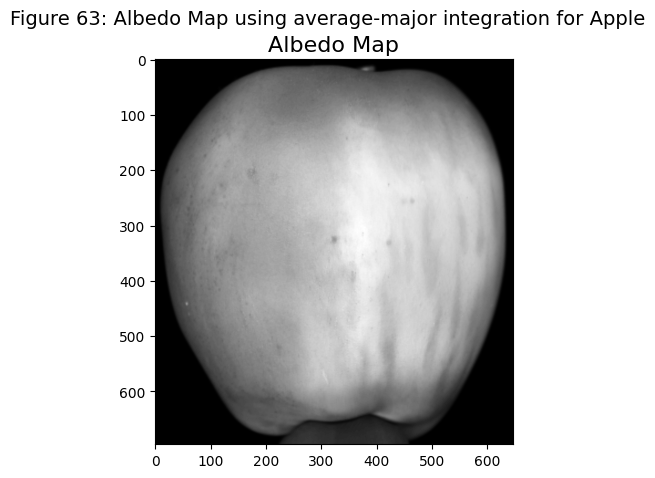

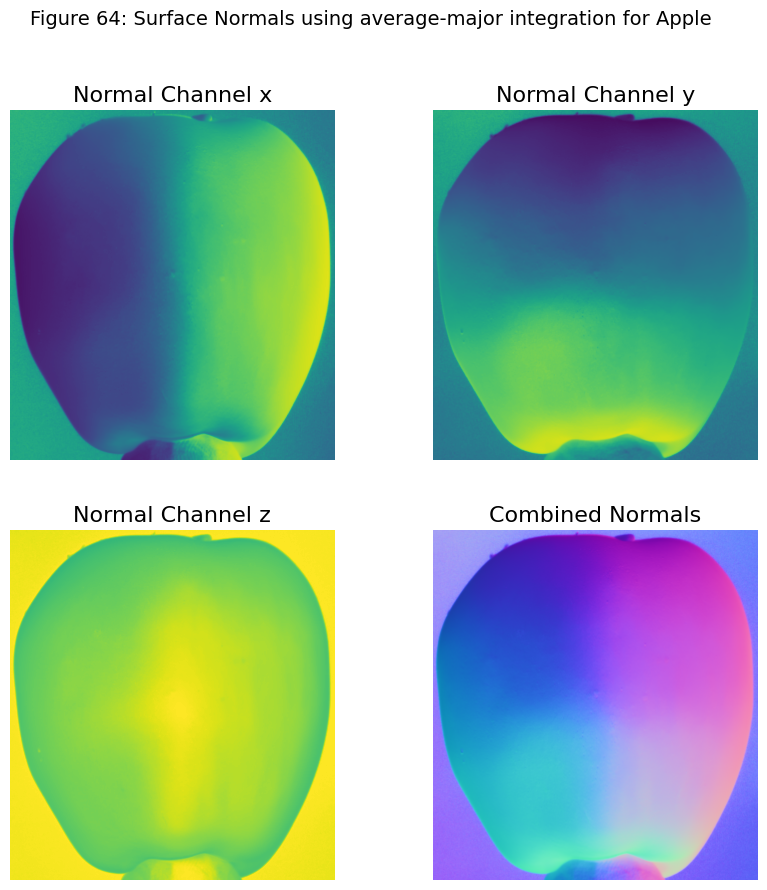

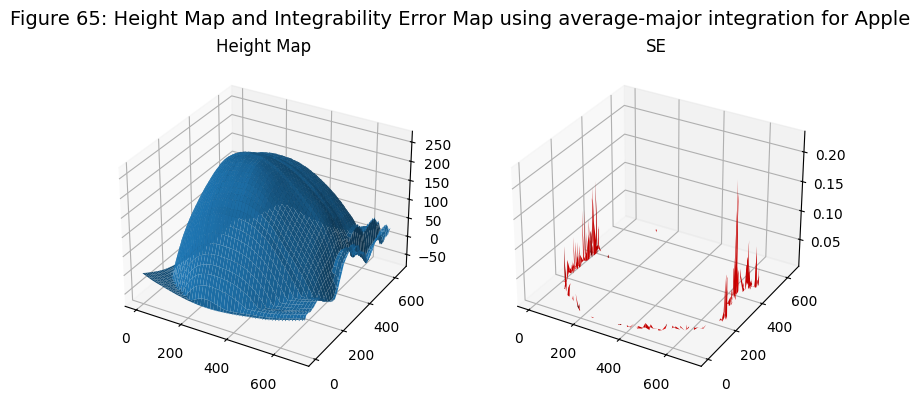

In [46]:
# YOUR CODE HERE
titles = {
    "albedo": "Figure 57: Albedo Map using column-major integration for Apple",
    "normal": "Figure 58: Surface Normals using column-major integration for Apple",
    "HSE": "Figure 59: Height Map and Integrability Error Map using column-major integration for Apple"
}
photometric_stereo_apple_dataset(titles, './photometrics_images/Apple/', 'column')

titles = {
    "albedo": "Figure 60: Albedo Map using row-major integration for Apple",
    "normal": "Figure 61: Surface Normals using row-major integration for Apple",
    "HSE": "Figure 62: Height Map and Integrability Error Map using row-major integration for Apple"
}
photometric_stereo_apple_dataset(titles, './photometrics_images/Apple/', 'row')

titles = {
    "albedo": "Figure 63: Albedo Map using average-major integration for Apple",
    "normal": "Figure 64: Surface Normals using average-major integration for Apple",
    "HSE": "Figure 65: Height Map and Integrability Error Map using average-major integration for Apple"
}
photometric_stereo_apple_dataset(titles, './photometrics_images/Apple/', 'average')

Figure 57 shows the albedo for the Apple dataset using column-major integration.

Figure 58 shows the surface normals for the Apple dataset using column-major integration, showed as separate x/y/z channels and a combined visualization.

Figure 59 shows the height map and integrability error for the Apple dataset using column-major integration. The height map shows the apple form, and the SE is around the edges of the apple.

Figure 60 shows the albedo for the Apple dataset using row-major integration.

Figure 61 shows the surface normals for the Apple dataset using row-major integration, showed as separate x/y/z channels and a combined visualization.

Figure 62 shows the height map and integrability error for the Apple dataset using row-major integration. The height map shows the apple form, and the SE is around the edges of the apple.

Figure 63 shows the albedo for the Apple dataset using average-major integration.

Figure 64 shows the surface normals for the Apple dataset using average-major integration, showed as separate x/y/z channels and a combined visualization.

Figure 65 shows the height map and integrability error for the Apple dataset using average-major integration. The height map shows the apple form, and the SE is around the edges of the apple.

<a id="question-37"></a>
#### <font color='#FF0000'>Question 37 (1 point)</font>

Observe and discuss the results for different integration paths in the `photometric_stereo_apple_dataset` function.

##### <font color='yellow'>Answer:</font>

>The combined normal maps look good for all paths (as seen in Figures 58, 61 and 64), and the errors appear mostly around the edges because pixels near the edge mix with the background and give unreliable normals. All height maps show an apple shape (including the trunk of the apple). The column path integration gives a shallower depth, because errors build from top to bottom, making the apple look flatter. For row path integration, errors build from left to right, making the edges on the right side look more steep. Average path intergration averages these two errors, which cancels out the issues. This gives a depth map with a more stable reconstruction of the apple. These results can be seen in Figures 59, 62 and 65.

<a id="section-x"></a>
### **Section X: Individual Contribution Report *(Mandatory)***

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.

| Name | Contribution on Research | Contribution on Programming | Contribution on Writing |
| -------- | ------- | ------- | ------- |
| Alex Raudvee | 33 % | 34 % | 33 % |
| Ozan Ilhan | 33 % | 33 % | 34 % |
| Nora Kahleogullari | 34 % | 33 % | 33 % |

### - End of Notebook -